In [1]:
# installations - twitter api
# !pip3 install twitterscraper

# imports
import os
import re
import pandas as pd
import numpy as np
import datetime as dt 
import matplotlib.pyplot as plt
import seaborn as sns

from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from bs4 import BeautifulSoup
from wordcloud import WordCloud
from twitterscraper import query_tweets

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

INFO: {'User-Agent': 'Mozilla/5.0 (Windows NT 5.2; RW; rv:7.0a1) Gecko/20091211 SeaMonkey/9.23a1pre'}


In [23]:
# function created to scrape tweets for a particular hashtag, convert to a dataframe and write/append to a .csv file
# reference for scraping code: https://www.youtube.com/watch?v=zF_Q2v_9zKY

def twitter_scrape(hashtag):
    begin_date = dt.date(2020,1,2)
    end_date = dt.date(2020,3,24)

    tweets = query_tweets(hashtag, begindate = begin_date, enddate = end_date, lang = 'en')
    # write the tweets to a dataframe
    df = pd.DataFrame(t.__dict__ for t in tweets)
    # drop duplicates from the dataframe
    df = df.loc[df.astype(str).drop_duplicates().index]
    if not os.path.isfile('../datasets/tweets1.csv'):
        df.to_csv('../datasets/tweets1.csv') # write to .csv with header (initial write)
    else:
        df.to_csv('../datasets/tweets1.csv', mode='a', header=False) # append to existing .csv file without header rows
    return df

In [26]:
twitter_scrape('COVID')

INFO: queries: ['COVID since:2020-01-02 until:2020-01-06', 'COVID since:2020-01-06 until:2020-01-10', 'COVID since:2020-01-10 until:2020-01-14', 'COVID since:2020-01-14 until:2020-01-18', 'COVID since:2020-01-18 until:2020-01-22', 'COVID since:2020-01-22 until:2020-01-26', 'COVID since:2020-01-26 until:2020-01-30', 'COVID since:2020-01-30 until:2020-02-03', 'COVID since:2020-02-03 until:2020-02-07', 'COVID since:2020-02-07 until:2020-02-12', 'COVID since:2020-02-12 until:2020-02-16', 'COVID since:2020-02-16 until:2020-02-20', 'COVID since:2020-02-20 until:2020-02-24', 'COVID since:2020-02-24 until:2020-02-28', 'COVID since:2020-02-28 until:2020-03-03', 'COVID since:2020-03-03 until:2020-03-07', 'COVID since:2020-03-07 until:2020-03-11', 'COVID since:2020-03-11 until:2020-03-15', 'COVID since:2020-03-15 until:2020-03-19', 'COVID since:2020-03-19 until:2020-03-24']
INFO: Querying COVID since:2020-01-06 until:2020-01-10
INFO: Querying COVID since:2020-01-10 until:2020-01-14
INFO: Querying

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLrh2LGm_CEWgMC64dixpvwhEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 196.53.25.96:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgKORuOnA7SEWgoCjkbjpwO0hEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 196.53.25.96:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwKC90oHZ9iEWgsCgvdKB2fYhEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 196.53.25.96:80
INFO: Retryin

INFO: Using proxy 78.92.84.112:8080
INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 78.92.84.112:8080
INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 78.92.84.112:8080
INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 78.92.84.112:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgKaR_tK3pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 196.53.25.96:80
INFO: Sc

INFO: Using proxy 144.217.118.206:8080
INFO: Using proxy 134.209.44.228:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKKxqN7pkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLyB3ITesSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 144.217.118.206:8080
INFO: Using proxy 144.217.118.206:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwL6B0q6koiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3

INFO: Using proxy 200.229.220.42:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwKCZyObKrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 78.92.84.112:8080
INFO: Retrying... (Attempts left: 39)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Retrying... (Attempts left: 39)
INFO: Using proxy 103.130.70.245:80
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 103.130.70.245:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKgLW9wsS3pyIWgI

INFO: Using proxy 36.67.32.87:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgKOJ0pnxtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Retrying... (Attempts left: 36)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 36.67.32.87:8080
INFO: Using proxy 196.53.25.216:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTtz7vokiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 36.67.32.87:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&includ

INFO: Using proxy 134.209.44.228:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaGwL25kefTjSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 134.122.114.130:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLv9tre3pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 134.209.44.228:80
INFO: Retrying... (Attempts left: 33)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 134.35.56.112:8080
INFO: Retrying... (Attempts left: 32)
INFO: Scraping tweets from https://twitter.com/sear

INFO: Using proxy 118.200.73.124:8080
INFO: Retrying... (Attempts left: 29)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 190.136.181.232:999
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLvh6_-joiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 118.200.73.124:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgKeF4_vdsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 118.200.73.124:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=de

INFO: Using proxy 103.235.199.93:35947
INFO: Retrying... (Attempts left: 26)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 46.34.175.224:8080
INFO: Retrying... (Attempts left: 26)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 46.34.175.224:8080
INFO: Retrying... (Attempts left: 26)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 46.34.175.224:8080
INFO: Retrying... (Attempts left: 26)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 46.34.175.224:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&i

INFO: Using proxy 103.130.70.245:80
INFO: Retrying... (Attempts left: 22)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 159.192.101.137:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgKPtn_fdsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 103.130.70.245:80
INFO: Retrying... (Attempts left: 22)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLDhwf7lkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Retrying... (Attempts left: 21)
INFO: Using proxy 103.130.70.245:80
INFO: Scraping t

INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 151.248.63.154:8080
INFO: Using proxy 191.102.93.26:999
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwL7dyZa3pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 103.104.134.219:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLz5oJbQjSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 213.6.98.169:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&includ

INFO: Using proxy 196.53.25.216:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgKPx2_3kkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 196.53.25.216:80
INFO: Retrying... (Attempts left: 15)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 158.140.169.104:8181
INFO: Retrying... (Attempts left: 15)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 158.140.169.104:8181
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwKLNxo6QnSIW

INFO: Using proxy 195.181.210.160:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwL6lu9D7lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 23.102.166.13:3128
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwL2NqJvOjSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 23.102.166.13:3128
INFO: Retrying... (Attempts left: 12)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 195.181.210.160:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=de

INFO: Retrying... (Attempts left: 9)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 202.191.127.170:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLqBko_xtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 134.35.56.112:8080
INFO: Retrying... (Attempts left: 8)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 196.54.30.99:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwL7B6u7dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20sin

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKq59rGjoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwL6h9M2PnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 103.250.166.12:6666
INFO: Using proxy 103.250.166.12:6666
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLTp_q3MjSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Retrying... (Attempts left: 4)
IN

INFO: Using proxy 134.35.58.29:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgKaBj7jKrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 190.136.181.232:999
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwL3x4-rdsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 45.172.108.44:9991
INFO: Retrying... (Attempts left: 2)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=COVID%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 134.35.58.29:8080
INFO: Retrying... (Attempts left: 1)
INFO: Scraping tweets from https://twitter.com/search?

INFO: Using proxy 181.143.73.34:53281
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLS5-8u-iCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 181.143.73.34:53281
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLzNkIepvSIWhICozcGbqb0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 181.143.73.34:53281
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgKP1j-fdsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
I

INFO: Using proxy 46.34.175.224:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKPlseTdsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 46.34.175.224:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKKpwN22pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 187.86.128.29:3128
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLfBkK3hkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO

INFO: Using proxy 196.52.80.213:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwL2F8vGioiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 196.52.80.213:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwKL5mcTgkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 196.52.80.213:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLSZrITxtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Usin

INFO: Using proxy 188.6.164.138:55042
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKCRtty8iCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 188.6.164.138:55042
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgKiJlKLKrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 41.205.11.28:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaGgLW5_Yb5lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INF

INFO: Using proxy 151.248.63.154:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgKeJ2OD4lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 41.205.11.28:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLvBkry2pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 191.102.93.26:999
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaGgLWJ4v_wtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO:

INFO: Using proxy 217.150.150.17:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLqhvNbdsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 118.70.185.14:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgKP99ZyOnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 118.70.185.14:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKfJtZPKrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO:

INFO: Using proxy 158.140.169.104:8181
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLut_6aioiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 158.140.169.104:8181
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLCtxbe6iCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 202.62.88.185:83
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXZ_PiovSIWhICozcGbqb0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-19%20until%3A2020-03-24&l=en
IN

INFO: Using proxy 195.181.210.160:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKDJnf-5iCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 195.181.210.160:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKexu5zAjSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 202.62.88.185:83
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKLZg4bKrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
IN

INFO: Using proxy 202.72.233.18:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgKiFpczdsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 212.98.159.196:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLyh0PuhoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 212.98.159.196:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLX16M2NnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en
IN

INFO: Using proxy 196.54.30.99:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKeB3Iq2pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKDdzfTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 196.52.58.197:80
INFO: Using proxy 196.52.58.197:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSdgLKNnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using

INFO: Using proxy 180.250.204.93:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLXp-PLwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 180.250.204.93:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaugLvZuPDXkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 196.54.30.89:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKrRpfS3iCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO:

INFO: Using proxy 180.250.204.93:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL35taC3iCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 196.54.30.160:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKPZmu3JrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 37.111.42.210:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgKOxvcHdsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO:

INFO: Using proxy 37.111.42.210:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwL61nqP2lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaOwLzl74a6jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 134.35.58.29:8080
INFO: Using proxy 196.54.30.160:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLeNi-zUkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: U

INFO: Using proxy 37.111.42.210:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLClrcSMnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 41.217.206.86:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwKDRh-zwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 196.52.80.200:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWRguK1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: 

INFO: Using proxy 194.5.192.154:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLzp_unwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 194.5.192.154:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLu9msa1iCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 194.5.192.154:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLCtvLfdsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Usin

INFO: Using proxy 103.14.198.14:83
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwKrlzoP1lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 103.130.70.218:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSJmLTdsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 103.14.198.14:83
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL7p1f2goiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Usi

INFO: Using proxy 200.69.83.50:9991
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLyV7NX0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 196.53.25.56:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaGwLzBl9zRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 196.52.58.85:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using

INFO: Using proxy 206.189.202.230:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 206.189.202.230:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 206.189.202.230:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLzZhfqLnSIWgMC92eGrkZ0iEjUAFQAlAFUAF

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 185.238.239.44:8090
INFO: Using proxy 196.53.25.117:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/m

INFO: Using proxy 185.238.239.44:8090
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_d

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Retrying... (Attempts left: 48)
INFO: Using proxy 206.189.202.230:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 46.254.247.57:3130
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUA

INFO: Retrying... (Attempts left: 49)
INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Retrying... (Attempts left: 49)
INFO: Retrying... (Attempts left: 48)
INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3Cp

INFO: Using proxy 182.253.170.152:8080
INFO: Retrying... (Attempts left: 47)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 185.238.239.44:8090
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anacon

INFO: Retrying... (Attempts left: 48)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 206.189.36.13:47503
INFO: Retrying... (Attempts left: 47)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anacond

INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 200.69.83.50:9991
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/

INFO: Retrying... (Attempts left: 47)
INFO: Retrying... (Attempts left: 47)
INFO: Retrying... (Attempts left: 47)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/l

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Using proxy 46.254.247.57:3130
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_de

INFO: Retrying... (Attempts left: 43)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 196.53.25.117:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLDN18b0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/m

INFO: Using proxy 182.253.170.152:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Using proxy 124.158.175.19:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 86.57.219.178:23500
INFO: Using proxy 124.158.175.19:8080
INFO: Retrying... (Attempts left: 43)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwL7hzeKovSIWhICozcGbqb0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 124.158.175.19:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=

INFO: Retrying... (Attempts left: 41)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_d

INFO: Retrying... (Attempts left: 42)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 162.17.252.5:43764
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Using proxy 103.134.213.50:8080
INFO: Retrying... (Attempts left: 41)
INFO: Using proxy 62.205.169.74:53281
INFO: Using proxy 103.134.213.50:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 103.134.213.50:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_

INFO: Using proxy 128.199.142.123:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_

INFO: Retrying... (Attempts left: 40)
INFO: Retrying... (Attempts left: 40)
INFO: Retrying... (Attempts left: 39)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwL7hzeKovSIWhICozcGbqb0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
I

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLDN18b0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Retrying... (Attempts left: 38)
INFO: Using proxy 86.57.219.178:23500
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 112.78.43.225:808
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUA

INFO: Retrying... (Attempts left: 37)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLDN18b0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 157.119.118.122:45653
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLzZhfqLnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/reque

INFO: Using proxy 77.247.89.254:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_de

INFO: Retrying... (Attempts left: 36)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLDN18b0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 62.205.169.74:53281
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLzZhfqLnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/request

INFO: Retrying... (Attempts left: 36)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Retrying... (Attempts left: 37)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 196.52.65.184:80
INFO: Using proxy 62.205.169.74:53281
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBa

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLDN18b0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 134.122.75.190:8080
INFO: Using proxy 134.122.75.190:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/request

INFO: Using proxy 112.78.43.225:808
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_dec

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Retrying... (Attempts left: 35)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 196.52.58.55:80
INFO: Using proxy 112.78.43.225:808
INFO: S

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Retrying... (Attempts left: 35)
INFO: Retrying... (Attempts left: 34)
INFO: Retrying... (Attempts left: 33)
INFO: Retrying... (Attempts left: 35)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Retrying... (Attempts left: 35)
INFO: Retrying... (Attempts left: 33)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_positi

INFO: Retrying... (Attempts left: 33)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 196.52.65.184:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/m

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Retrying... (Attempts left: 32)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_d

INFO: Using proxy 196.52.65.184:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLzZhfqLnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_deco

INFO: Retrying... (Attempts left: 31)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    re

INFO: Using proxy 92.86.10.42:42658
INFO: Retrying... (Attempts left: 32)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLzZhfqLnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337,

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Retrying... (Attempts left: 31)
INFO: Retrying... (Attempts left: 29)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLzZhfqLnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 92.86.10.42:42658
INFO: Using proxy 87.250.218.12:33759
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVB

INFO: Retrying... (Attempts left: 29)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_d

INFO: Using proxy 87.250.218.12:33759
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLzZhfqLnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_d

INFO: Retrying... (Attempts left: 28)
INFO: Retrying... (Attempts left: 28)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 33

INFO: Retrying... (Attempts left: 29)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLzZhfqLnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_d

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Retrying... (Attempts left: 27)
INFO: Retrying... (Attempts left: 28)
INFO: Retrying... (Attempts left: 26)
I

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 46.146.197.19:50611
INFO: Retrying... (Attempts left: 27)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 46.146.197.19:50611
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAF

INFO: Retrying... (Attempts left: 26)
INFO: Retrying... (Attempts left: 25)
INFO: Retrying... (Attempts left: 25)
INFO: Retrying... (Attempts left: 27)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Retrying... (Attempts left: 27)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Retrying... (Attempts left: 26)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1

INFO: Retrying... (Attempts left: 26)
INFO: Retrying... (Attempts left: 26)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 200.73.129.17:3128
INFO: Using proxy 200.73.129.17:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVB

INFO: Retrying... (Attempts left: 26)
INFO: Retrying... (Attempts left: 26)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 33

INFO: Using proxy 180.211.183.178:32009
INFO: Retrying... (Attempts left: 25)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 180.211.183.178:32009
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/ana

INFO: Using proxy 180.211.183.178:32009
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLDN18b0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw

INFO: Retrying... (Attempts left: 24)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 91.205.51.27:49805
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests

INFO: Retrying... (Attempts left: 22)
INFO: Retrying... (Attempts left: 24)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLDN18b0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 49.0.1.42:8080
INFO: Using proxy 91.205.51.27:49805
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgL

INFO: Retrying... (Attempts left: 23)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 49.0.1.42:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mod

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLDN18b0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Retrying... (Attempts left: 23)
INFO: Using proxy 190.152.71.230:54354
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 49.0.1.42:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQ

INFO: Retrying... (Attempts left: 22)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 190.152.71.230:54354
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/reques

INFO: Retrying... (Attempts left: 22)
INFO: Retrying... (Attempts left: 22)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 33

INFO: Retrying... (Attempts left: 21)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 89.42.133.58:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/

INFO: Using proxy 216.169.5.51:61939
INFO: Retrying... (Attempts left: 19)
INFO: Retrying... (Attempts left: 20)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 172.254.124.231:3128
INFO: Using proxy 190.152.71.230:54354
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state

INFO: Retrying... (Attempts left: 20)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 172.254.124.231:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/reques

INFO: Retrying... (Attempts left: 19)
INFO: Retrying... (Attempts left: 18)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Retrying... (Attempts left: 19)
INFO: Using proxy 196.54.30.54:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020

INFO: Retrying... (Attempts left: 19)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 43.229.25.13:55186
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLDN18b0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Retrying... (Attempts left: 18)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Retrying... (Attempts left: 18)
INFO: Using proxy 196.54.30.186:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 196.54.30.186:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwL

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Using proxy 216.169.5.51:61939
INFO: Retrying... (Attempts left: 17)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 216.169.5.51:61939
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLzZhfqLnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Using proxy 216.169.5.51:61939
INFO: Retrying... (Attempts left: 16)
INFO: Using proxy 196.54.30.54:80
INFO: Using proxy 196.54.30.54:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 196.54.30.54:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLzZhfqLnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Retrying... (Attempts left: 15)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 196.53.25.120:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLzZhfqLnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/m

INFO: Using proxy 202.138.242.41:59199
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_

INFO: Retrying... (Attempts left: 13)
INFO: Using proxy 196.53.25.120:80
INFO: Using proxy 202.138.242.41:59199
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Retrying... (Attempts left: 12)
INFO: Using proxy 196.53.25.120:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 202.138.242.41:59199
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=t

INFO: Retrying... (Attempts left: 13)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Retrying... (Attempts left: 13)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 179.127.243.1:49465
I

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Using proxy 179.127.243.1:49465
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLDN18b0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_d

INFO: Retrying... (Attempts left: 11)
INFO: Retrying... (Attempts left: 11)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 191.189.30.85:51231
INFO: Using proxy 188.235.3.43:40621
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFV

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kw

INFO: Retrying... (Attempts left: 10)
INFO: Retrying... (Attempts left: 10)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 196.53.25.38:80
INFO: Using proxy 178.93.3.32:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLS

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Using proxy 196.53.25.207:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_deco

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Using proxy 188.235.3.43:40621
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_de

INFO: Retrying... (Attempts left: 8)
INFO: Retrying... (Attempts left: 8)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaMwLSx5-OgoiIWgMC03c3CpKIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitte

INFO: Retrying... (Attempts left: 7)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 178.93.3.32:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwKH1wcjJrCIWgsCg1cXwyqwiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mo

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLzZhfqLnSIWgMC92eGrkZ0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Retrying... (Attempts left: 6)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLWp4_aziCIWgIC7yarNxIgiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 196.53.25.207:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mo

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLC97q_dsSIWgsC03deH3rEiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Using proxy 196.53.25.207:80
INFO: Using proxy 196.53.25.207:80
INFO: Using proxy 1.32.59.217:58451
INFO: Using proxy 196.53.25.207:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 1.32.59.217:58451
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Using proxy 103.29.221.99:60753
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_d

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLSlwuTwtiIWjMC09d-e8bYiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLDN18b0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 196.53.25.231:80
INFO: Using proxy 196.53.25.235:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mode

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLXd3K-1jSIWhoC3nfDi140iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Retrying... (Attempts left: 2)
INFO: Retrying... (Attempts left: 2)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEgLDN18b0lyIWgMCjvbCT_pciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337,

INFO: Retrying... (Attempts left: 1)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_de

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCwLTVwqHRkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

INFO: Retrying... (Attempts left: 1)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwL7hzeKovSIWhICozcGbqb0iEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 103.29.221.99:60753
INFO: Got 3384 tweets (1109 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAgLCVtcS1pyIWgICoyfvYt6ciEjUAFQAlAFUAFQAA&q=COVID%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/li

,screen_name,username,user_id,tweet_id,tweet_url,timestamp,timestamp_epochs,text,text_html,links,...,has_media,img_urls,video_url,likes,retweets,replies,is_replied,is_reply_to,parent_tweet_id,reply_to_users
0,Capital_EKS,🎆🐑 Capital Ex🦎🎆,2616580153,1216374257028161536,/Capital_EKS/status/1216374257028161536,2020-01-12 14:59:56,1578841196,"1. Raven Guy \n2. Cham\n3. 4 / 10\n4. Ye, also...","<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,1,0,0,False,True,1216310173414907904,"[{'screen_name': 'chamington1', 'user_id': '30..."
2,erisreg,erisreg,1125823249336741889,1223937615348584448,/erisreg/status/1223937615348584448,2020-02-02 11:54:01,1580644441,"a usual thing here, they talk to one and othe...","<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,1,0,1,True,True,1223927752157532161,"[{'screen_name': 'TamlynRogers', 'user_id': '2..."
4,sanriokook,##aj⁷༝༝,1066921482700214272,1219773622996197377,/sanriokook/status/1219773622996197377,2020-01-22 00:07:48,1579651668,I COVID DB TBROW UP,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,1,1,0,False,False,,[]
6,dabaniwal1973,Dara Singh,1108008868997550080,1222360090197364737,/dabaniwal1973/status/1222360090197364737,2020-01-29 03:25:30,1580268330,Action supreme Court & Ramnath covid president...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,True,[https://pbs.twimg.com/media/EPayA3FVUAABO7J.jpg],,0,0,0,False,False,,[]
8,Stardraw,Stardraw,15872486,1225006149684080640,/Stardraw/status/1225006149684080640,2020-02-05 10:40:00,1580899200,New Symbol Updates for COVID https://www1.star...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://www1.stardraw.com/stardraw2/sd7/featu...,...,True,[https://pbs.twimg.com/media/EGQ187UXkAAiIMn.png],,0,0,0,False,False,,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12548,rcc_athletics,Riverside Athletics,889639599525572608,1237525776875941888,/rcc_athletics/status/1237525776875941888,2020-03-10 23:48:31,1583884111,IMPORTANT NOTICE \n-\nAttendance at the 2020 ...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[http://www.RCCATHLETICS.com],...,True,[https://pbs.twimg.com/media/ESyTIiJUMAEzGMg.jpg],,2,1,0,False,False,,[]
12549,Leve_raged,Haleÿ Is a White Rabbit,1139990630631989254,1237525775542173697,/Leve_raged/status/1237525775542173697,2020-03-10 23:48:31,1583884111,"People at work have split into two groups, peo...","<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,17,0,5,True,False,,[]
12550,YaniAtCVS,Yani Hurst,707640889921777664,1237525773902200832,/YaniAtCVS/status/1237525773902200832,2020-03-10 23:48:31,1583884111,@CVSHealth waives out-of-pocket costs related ...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://fortune-com.cdn.ampproject.org/c/s/fo...,...,False,[],,2,1,1,True,False,,[]
12551,andray,Andrej Nabergoj,5902722,1237525773184978944,/andray/status/1237525773184978944,2020-03-10 23:48:31,1583884111,Great COVID-19 Numbers Breakdown: https://nucl...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://nucleuswealth.com/articles/updated-co...,...,False,[],,2,2,0,False,False,,[]


In [31]:
twitter_scrape('COVID19')

INFO: queries: ['COVID19 since:2020-01-02 until:2020-01-06', 'COVID19 since:2020-01-06 until:2020-01-10', 'COVID19 since:2020-01-10 until:2020-01-14', 'COVID19 since:2020-01-14 until:2020-01-18', 'COVID19 since:2020-01-18 until:2020-01-22', 'COVID19 since:2020-01-22 until:2020-01-26', 'COVID19 since:2020-01-26 until:2020-01-30', 'COVID19 since:2020-01-30 until:2020-02-03', 'COVID19 since:2020-02-03 until:2020-02-07', 'COVID19 since:2020-02-07 until:2020-02-12', 'COVID19 since:2020-02-12 until:2020-02-16', 'COVID19 since:2020-02-16 until:2020-02-20', 'COVID19 since:2020-02-20 until:2020-02-24', 'COVID19 since:2020-02-24 until:2020-02-28', 'COVID19 since:2020-02-28 until:2020-03-03', 'COVID19 since:2020-03-03 until:2020-03-07', 'COVID19 since:2020-03-07 until:2020-03-11', 'COVID19 since:2020-03-11 until:2020-03-15', 'COVID19 since:2020-03-15 until:2020-03-19', 'COVID19 since:2020-03-19 until:2020-03-24']
INFO: Querying COVID19 since:2020-01-02 until:2020-01-06
INFO: Querying COVID19 sinc

INFO: Using proxy 45.114.36.57:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218939733528793088-1219753399433953280&q=COVID19%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 45.114.36.57:8080
INFO: Using proxy 45.114.36.57:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 45.114.36.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 144.217.118.206:8080
INFO: Using proxy 144.217.118.206:8080
INFO: Using proxy 72.252.4.177:8080
INFO: Using proxy 144.217.118.206:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830846498549761-1228831268197916672&q=COVID19%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users

INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://

INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 144.217.118.206:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py",

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Retrying... (Attempts left: 48)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Retrying... (Attempts left: 48)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 72.252.4.177:8080
INFO: Using proxy 72.252

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 48)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjs

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Retrying... (Attempts left: 47)
INFO: Using proxy 36.67.32.87:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 78.92.84.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 78.92.84.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 46)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s

INFO: Using proxy 36.67.32.87:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221013274893914113-1221146666889306112&q=COVID19%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, i

INFO: Retrying... (Attempts left: 46)
INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", 

INFO: Using proxy 36.67.32.87:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 36.67.32.87:8080
INFO: Using proxy 36.67.32.87:8080
INFO: Using proxy 36.67.32.87:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph

INFO: Retrying... (Attempts left: 45)
INFO: Retrying... (Attempts left: 45)
INFO: Retrying... (Attempts left: 45)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 134.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 134.122.114.130:8080
INFO: Using proxy 134.122.114.130:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py"

INFO: Retrying... (Attempts left: 45)
INFO: Retrying... (Attempts left: 43)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 134.209.44.228:80
INFO: Retrying... (Attempts left: 45)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/ak

INFO: Using proxy 134.209.44.228:80
INFO: Using proxy 134.209.44.228:80
INFO: Retrying... (Attempts left: 44)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 134.209.44.228:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhila

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 134.209.44.228:80
INFO: Retrying... (Attempts left: 44)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 134.209.44.228:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/s

INFO: Using proxy 134.209.44.228:80
INFO: Using proxy 134.209.44.228:80
INFO: Using proxy 103.235.199.93:35947
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218939733528793088-1219753399433953280&q=COVID19%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195975593984-1238978212723593217&q=COVID19%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 103.235.199.93:35947
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 42)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 200.229.220.42:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221013274893914113-1221146666889306112&q=COVID19%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 103.104.134.219:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(

INFO: Retrying... (Attempts left: 40)
INFO: Retrying... (Attempts left: 40)
INFO: Retrying... (Attempts left: 38)
INFO: Retrying... (Attempts left: 39)
INFO: Retrying... (Attempts left: 39)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=C

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 39)
INFO: Retrying... (Attempts left: 39)
INFO: Retrying... (Attempts left: 39)
INFO: Retrying... (Attempts left: 39)
INFO: Retrying... (Attempts left: 39)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830846498549761-1228831268197916672&q=COVID19%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218939733528793088-1219753399433953280&q=C

INFO: Retrying... (Attempts left: 38)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 103.104.134.219:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py",

INFO: Retrying... (Attempts left: 37)
INFO: Retrying... (Attempts left: 39)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 213.6.98.169:8080
INFO: Using proxy 196.53.25.216:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-122

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 38)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 103.104.134.219:8080
INFO: Using proxy 23.102.166.13:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20sinc

INFO: Retrying... (Attempts left: 36)
INFO: Retrying... (Attempts left: 38)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", 

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Retrying... (Attempts left: 38)
INFO: Using proxy 103.104.134.219:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 103.104.134.219:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20si

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 37)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 196.53.25.216:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", lin

INFO: Retrying... (Attempts left: 37)
INFO: Retrying... (Attempts left: 37)
INFO: Using proxy 181.117.176.236:61358
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 196.53.25.216:80
INFO: Using proxy 196.53.25.216:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195975593984-1238978212723593217&q=COVID19%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 23.102.166.13:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830846498549761-1228831268197916672&q=COVID19%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s,

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Retrying... (Attempts left: 36)
INFO: Retrying... (Attempts left: 35)
INFO: Using proxy 23.102.166.13:3128
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 23.102.166.13:3128
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A20

INFO: Retrying... (Attempts left: 35)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 181.117.176.236:61358
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py"

INFO: Retrying... (Attempts left: 35)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s

INFO: Using proxy 181.117.176.236:61358
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Retrying... (Attempts left: 35)
INFO: Using proxy 103.250.166.12:6666
INFO: Using proxy 181.117.176.236:61358
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-12346294736029

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 35)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 181.117.176.236:61358
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py"

INFO: Using proxy 134.35.56.112:8080
INFO: Using proxy 134.35.56.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in dec

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 103.250.166.12:6666
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195975593984-1238978212723593217&q=COVID19%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s

INFO: Using proxy 103.250.166.12:6666
INFO: Retrying... (Attempts left: 32)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 201.220.16.237:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218939733528793088-1219753399433953280&q=COVID19%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 201.220.16.237:8080
INFO: Retrying... (Attempts left: 32)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 201.220.16.237:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 201.220.16.237:8080
INFO: Using proxy 201.220.16.237:8080
INFO: Using proxy 201.220.16.237:8080
INFO: Retrying... (Attempts left: 30)
INFO: Using proxy 201.220.16.237:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 190.136.181.232:999
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", l

INFO: Retrying... (Attempts left: 31)
INFO: Retrying... (Attempts left: 31)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830846498549761-1228831268197916672&q=COVID19%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 45.172.108.44:9991
INFO: Using proxy 45.172.108.44:9991
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-

INFO: Retrying... (Attempts left: 31)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 45.172.108.44:9991
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", l

INFO: Using proxy 45.172.108.44:9991
INFO: Using proxy 190.136.181.232:999
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in de

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 190.136.181.232:999
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 45.172.108.44:9991
INFO: Using proxy 181.143.73.34:53281
INFO: Using proxy 45.172.108.44:9991
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 181.143.73.34:53281
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 45.172.108.44:9991
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218939733528793088-1219753399433953280&q=COVID19%20since%3A2020-01-18%20until%3A

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 190.136.181.232:999
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 29)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195975593984-1238978212723593217&q=COVID19%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 181.143.73.34:53281
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", 

INFO: Using proxy 181.143.73.34:53281
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s

INFO: Retrying... (Attempts left: 29)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjs

INFO: Retrying... (Attempts left: 29)
INFO: Retrying... (Attempts left: 27)
INFO: Retrying... (Attempts left: 28)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 181.

INFO: Retrying... (Attempts left: 27)
INFO: Retrying... (Attempts left: 28)
INFO: Using proxy 181.143.73.34:53281
INFO: Using proxy 181.143.73.34:53281
INFO: Using proxy 204.48.19.184:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Retrying... (Attempts left: 27)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 46.34.175.224:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=fal

INFO: Retrying... (Attempts left: 28)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 204.48.19.184:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", l

INFO: Retrying... (Attempts left: 28)
INFO: Retrying... (Attempts left: 28)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 204.48.19.184:8080
INFO: Using proxy 204.48.19.184:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 204.48.19.184:8080
INFO: Using proxy 204.48.19.184:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", li

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 187.86.128.29:3128
INFO: Retrying... (Attempts left: 25)
INFO: Using proxy 46.34.175.224:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 187.86.128.29:3128
INFO: Using proxy 46.34.175.224:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in dec

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "

INFO: Retrying... (Attempts left: 25)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830846498549761-1228831268197916672&q=COVID19%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 68.183.208.248:80
INFO: Using proxy 196.52.80.213:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode

INFO: Using proxy 196.52.80.213:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221013274893914113-1221146666889306112&q=COVID19%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 196.52.80.213:80
INFO: Using proxy 68.183.208.248:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 23)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 159.192.101.137:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830846498549761-1228831268197916672&q=COVID19%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", l

INFO: Using proxy 68.183.208.248:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 24)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 68.183.208.248:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218939733528793088-1219753399433953280&q=COVID19%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", li

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195975593984-1238978212723593217&q=COVID19%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 23)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 159.192.101.137:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", l

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 41.205.11.28:8080
INFO: Using proxy 159.192.101.137:80
INFO: Using proxy 188.6.164.138:55042
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/

INFO: Using proxy 188.6.164.138:55042
INFO: Using proxy 41.205.11.28:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221013274893914113-1221146666889306112&q=COVID19%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in dec

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 151.248.63.154:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjs

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 41.205.11.28:8080
INFO: Using proxy 151.248.63.154:8080
INFO: Using proxy 151.248.63.154:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 41.205.11.28:8080
INFO: Using proxy 151.248.63.154:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max

INFO: Retrying... (Attempts left: 21)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s

INFO: Retrying... (Attempts left: 21)
INFO: Retrying... (Attempts left: 20)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Retrying... (Attempts left: 20)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 41.205.11.28:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A20

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 191.102.93.26:999
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218939733528793088-1219753399433953280&q=COVID19%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 151.248.63.154:8080
INFO: Using proxy 191.102.93.26:999
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 151.248.63.154:8080
INFO: Using proxy 191.102.93.26:999
INFO: Using proxy 151.248.63.154:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%

INFO: Retrying... (Attempts left: 19)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 191.102.93.26:999
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", li

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 17)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195975593984-1238978212723593217&q=COVID19%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 217.150.150.17:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", li

INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 16)
INFO: Retrying... (Attempts left: 18)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 217.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Retrying... (Attempts left: 17)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Retrying... (Attempts left: 17)
INFO: Scraping tweets from https://twitter.com/i/search/time

INFO: Retrying... (Attempts left: 16)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218939733528793088-1219753399433953280&q=COVID19%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 158.140.169.104:8181
INFO: Using proxy 158.140.169.104:8181
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20si

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830846498549761-1228831268197916672&q=COVID19%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 15)
INFO: Retrying... (Attempts left: 16)
INFO: Retrying... (Att

INFO: Retrying... (Attempts left: 16)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 158.140.169.104:8181
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py",

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 202.62.88.185:83
INFO: Using proxy 158.140.169.104:8181
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 158.140.169.104:8181
INFO: Using proxy 195.181.210.160:8080
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 196.54.30.46:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 13)
INFO: Retrying... (Attempts left: 13)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 195.181.210.160:8080
INFO: Using proxy 195.181.210.160:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195975593984-1238978212723593217&q=COVID19%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaco

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221013274893914113-1221146666889306112&q=COVID19%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 202.62.88.185:83
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 195.181.210.160:8080
INFO: Using proxy 195.181.210.160:8080
INFO: Retrying... (Attempts left: 14)
INFO: Retrying... (Attempts left: 14)
INFO: Retrying... (Attempts left: 13)
INFO: Retrying... (Attempts left: 14)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Retrying... (Attempts left: 11)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 195.181.210.160:8080
INFO: Using proxy 202.72.233.18:8080
INFO: Using proxy 202.

INFO: Retrying... (Attempts left: 12)
INFO: Retrying... (Attempts left: 13)
INFO: Retrying... (Attempts left: 12)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218939733528793088-1219753399433953280&q=COVID19%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 202.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 202.72.233.18:8080
INFO: Using proxy 202.72.233.18:8080
INFO: Using proxy 202.72.233.18:8080
INFO: Using proxy 195.181.210.160:8080
INFO: Using proxy 202.72.233.18:8080
INFO: Using proxy 195.181.210.160:8080
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 212.98.159.196:8080
INFO: Using proxy 195.181.210.160:8080
INFO: Using proxy 202.72.233.18:8080
INFO: Using proxy 195.181.210.160:8080
INFO: Using proxy 212.98.159.196:8080
INFO: Using proxy 212.98.159.196:8080
INFO: Using proxy 202.191.127.170:80
INFO: Retrying... (Attempts left: 12)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_featu

INFO: Retrying... (Attempts left: 12)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830846498549761-1228831268197916672&q=COVID19%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 202.72.233.18:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", l

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 10)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221013274893914113-1221146666889306112&q=COVID19%20since%3A2020-01-22%20until%3A2020-01-26&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjs

INFO: Using proxy 202.191.127.170:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s,

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213746660800712704-1213893748708577282&q=COVID19%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221013274893914113-1221146666889306112&q=COVID19%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 9)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830846498549761-1228831268197916672&q=COVID19%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 196.54.30.99:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Retrying... (Attempts left: 8)
INFO: Using proxy 196.54.30.89:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 196.52.58.197:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 196.52.58.197:80
INFO: Using proxy 196.54.30.99:80
INFO: Using proxy 202.191.127.170:80
INFO: Using proxy 202.191.127.170:80
INFO: Using proxy 196.52.58.197:80
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 180.250.204.93:8080
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 196.52.58.197:80
INFO: Using proxy 196.54.30.99:80
INFO: Using proxy 196.52.58.197:80
INFO: Using proxy 196.52.58.197:80
INFO: Using proxy 196.54.30.89:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&incl

INFO: Retrying... (Attempts left: 6)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 180.250.204.93:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218939733528793088-1219753399433953280&q=COVID19%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", l

INFO: Retrying... (Attempts left: 8)
INFO: Retrying... (Attempts left: 7)
INFO: Retrying... (Attempts left: 5)
INFO: Retrying... (Attempts left: 9)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 6)
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 180.250.204.93:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 180.250.204.93:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195975593984-1238978212723593217&q=COVID19%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in qu

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218939733528793088-1219753399433953280&q=COVID19%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Retrying... (Attempts left: 8)
INFO: Using proxy 196.52.65.194:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 196.52.58.197:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A202

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221013274893914113-1221146666889306112&q=COVID19%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 7)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s,

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities

INFO: Using proxy 196.54.30.89:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730195301834753-1231730432963538944&q=COVID19%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, id

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Retrying... (Attempts left: 3)
INFO: Retrying... (Attempts left: 6)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Retrying... (Attempts left: 4)
INFO: Retrying... (Attempts left: 5)
INFO: Using proxy 196.54.30.160:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-1240427765284900870&q=COVID19%

INFO: Using proxy 196.54.30.160:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, i

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 3)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222547221939478528-1222669663781490688&q=COVID19%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 134.35.58.29:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830846498549761-1228831268197916672&q=COVID19%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", lin

INFO: Using proxy 196.54.30.160:80
INFO: Using proxy 37.111.42.210:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decod

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 3)
INFO: Retrying... (Attempts left: 2)
INFO: Retrying... (Attempts left: 3)
INFO: Retrying... (Attempts left: 5)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1217727860141699072-1218161013293572096&q=COVID19%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Retrying... (Attempts left: 5)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221013274893914113-1221146666889306112&q=COVID1

INFO: Retrying... (Attempts left: 4)
INFO: Retrying... (Attempts left: 3)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225448078737629185-1225544271949967360&q=COVID19%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 134.35.58.29:8080
INFO: Using proxy 196.54.30.160:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427755407368193-12404

INFO: Retrying... (Attempts left: 4)
INFO: Retrying... (Attempts left: 1)
INFO: Retrying... (Attempts left: 3)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629473602953216-1234629556994215936&q=COVID19%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1214561074684420098-1215135234905210880&q=COVID19%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 196.54.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Using proxy 196.54.30.160:80
INFO: Using proxy 192.200.200.102:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079046074740736-1236079104127946753&q=COVID19%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in dec

INFO: Retrying... (Attempts left: 1)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830846498549761-1228831268197916672&q=COVID19%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):


ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179892352770051-1233180008212049920&q=COVID19%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528636699242496-1237528654541799424&q=COVID19%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Retrying... (Attempts left: 1)
INFO: Got 20 tweets for COVID19%20since%3A2020-03-03%20until%3A2020-03-07.
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215653149756854279-1216769032763904006&q=COVID19%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Got 99 tweets (20 new).
INFO: Got 20 tweets for COVID19%20since%3A2020-01-22%20until%3A2020-01-26.
INFO: Retrying... (Attempts left: 2)
INFO: Got 119 tweets (20 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381458383331330-1227381760603938816&q=COVID19%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda

INFO: Got 177 tweets (19 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239694554816512-1242239704839290882&q=COVID19%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_

INFO: Retrying... (Attempts left: 2)
INFO: Got 18 tweets for COVID19%20since%3A2020-03-19%20until%3A2020-03-24.
INFO: Got 19 tweets for COVID19%20since%3A2020-01-02%20until%3A2020-01-06.
INFO: Got 20 tweets for COVID19%20since%3A2020-01-26%20until%3A2020-01-30.
INFO: Got 19 tweets for COVID19%20since%3A2020-02-20%20until%3A2020-02-24.
INFO: Using proxy 37.111.42.210:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830846498549761-1228831268197916672&q=COVID19%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/s

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280154045304832-1230280887658569730&q=COVID19%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/a

INFO: Got 346 tweets (17 new).
INFO: Got 20 tweets for COVID19%20since%3A2020-02-03%20until%3A2020-02-07.
INFO: Got 366 tweets (20 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223969349196812289-1224119408924221441&q=COVID19%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph

,screen_name,username,user_id,tweet_id,tweet_url,timestamp,timestamp_epochs,text,text_html,links,...,has_media,img_urls,video_url,likes,retweets,replies,is_replied,is_reply_to,parent_tweet_id,reply_to_users
0,itchy__fingers,Alkali!,325155773,1219753399433953280,/itchy__fingers/status/1219753399433953280,2020-01-21 22:47:27,1579646847,This clip is about three (3) years ago. Why br...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,0,0,0,False,True,1219736214099709952,"[{'screen_name': 'SadiqArewa', 'user_id': '883..."
1,itchy__fingers,Alkali!,325155773,1219749622509383681,/itchy__fingers/status/1219749622509383681,2020-01-21 22:32:26,1579645946,Are you among the hashtag category?,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,1,0,1,True,True,1219745570098728960,"[{'screen_name': 'BrownZieY', 'user_id': '1121..."
2,itchy__fingers,Alkali!,325155773,1219745160701018114,/itchy__fingers/status/1219745160701018114,2020-01-21 22:14:42,1579644882,And they didhttps://twitter.com/FaroukAbdulaha...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://twitter.com/FaroukAbdulahad/status/12...,...,False,[],,2,1,1,True,False,,[]
3,itchy__fingers,Alkali!,325155773,1219745096909905920,/itchy__fingers/status/1219745096909905920,2020-01-21 22:14:27,1579644867,Hector Bellerin https://twitter.com/halyma80/s...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://twitter.com/halyma80/status/121974162...,...,False,[],,2,1,0,False,False,,[]
4,itchy__fingers,Alkali!,325155773,1219744833709002752,/itchy__fingers/status/1219744833709002752,2020-01-21 22:13:24,1579644804,Very good result indeedhttps://twitter.com/Ric...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://twitter.com/Richee_Rich/status/121974...,...,False,[],,2,0,0,False,False,,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380,covid__19,I am Coronavirus COVID-19,1221955502340558848,1224086265626267648,/covid__19/status/1224086265626267648,2020-02-02 21:44:42,1580679882,I love surf. #coronavirus #coronarivirus #cali...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://twitter.com/BNODesk/status/1224084744...,...,False,[],,0,0,0,False,False,,[]
381,covid__19,I am Coronavirus COVID-19,1221955502340558848,1224084714975322112,/covid__19/status/1224084714975322112,2020-02-02 21:38:33,1580679513,"Hey, I am still here. Surprise.","<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,0,0,1,True,True,1223210241619320833,"[{'screen_name': 'lordycults', 'user_id': '165..."
382,covid19_info,💡🇫🇷COVID-19-INFO🗣🦠😷,1223665551551188994,1224056431235817473,/covid19_info/status/1224056431235817473,2020-02-02 19:46:09,1580672769,Hello any English subtitles ?,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,0,0,1,True,True,1223810414846234625,"[{'screen_name': 'MgOqkzLBRPLCHyN', 'user_id':..."
383,covid__19,I am Coronavirus COVID-19,1221955502340558848,1224046174493138949,/covid__19/status/1224046174493138949,2020-02-02 19:05:24,1580670324,"Come on, let's be friends. Meet me?","<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,0,0,0,False,True,1223511411474780161,"[{'screen_name': 'Erik_van_Soest', 'user_id': ..."


In [30]:
twitter_scrape('covid')

INFO: queries: ['covid since:2020-01-02 until:2020-01-06', 'covid since:2020-01-06 until:2020-01-10', 'covid since:2020-01-10 until:2020-01-14', 'covid since:2020-01-14 until:2020-01-18', 'covid since:2020-01-18 until:2020-01-22', 'covid since:2020-01-22 until:2020-01-26', 'covid since:2020-01-26 until:2020-01-30', 'covid since:2020-01-30 until:2020-02-03', 'covid since:2020-02-03 until:2020-02-07', 'covid since:2020-02-07 until:2020-02-12', 'covid since:2020-02-12 until:2020-02-16', 'covid since:2020-02-16 until:2020-02-20', 'covid since:2020-02-20 until:2020-02-24', 'covid since:2020-02-24 until:2020-02-28', 'covid since:2020-02-28 until:2020-03-03', 'covid since:2020-03-03 until:2020-03-07', 'covid since:2020-03-07 until:2020-03-11', 'covid since:2020-03-11 until:2020-03-15', 'covid since:2020-03-15 until:2020-03-19', 'covid since:2020-03-19 until:2020-03-24']
INFO: Querying covid since:2020-01-06 until:2020-01-10
INFO: Querying covid since:2020-01-02 until:2020-01-06
INFO: Scraping

INFO: Retrying... (Attempts left: 50)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222360090197364737-1222360090197364737&q=covid%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 196.53.25.96:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897

INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222360090197364737-1222360090197364737&q=covid%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Retrying... (Attempts left: 49)
INFO: Using proxy 144.217.118.206:8080
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 196.53.25.96:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib

INFO: Retrying... (Attempts left: 48)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222360090197364737-1222360090197364737&q=covid%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 72.252.4.177:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 8

INFO: Using proxy 78.92.84.112:8080
INFO: Retrying... (Attempts left: 48)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 144.217.118.206:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/pyth

INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222360090197364737-1222360090197364737&q=covid%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 36.67.32.87:8080
INFO: Retrying... (Attempts left: 48)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 144.217.118.206:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 45.114.36.57:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_availabl

INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224760370507735042-1225006149684080640&q=covid%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 45.114.36.57:8080
INFO: Using proxy 36.67.32.87:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 45.114.36.57:80

INFO: Retrying... (Attempts left: 45)
INFO: Retrying... (Attempts left: 45)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223937615348584448-1223937615348584448&q=covid%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 134.122.114.130:8080
INFO: Using proxy 134.122.114.130:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-

INFO: Using proxy 196.53.25.96:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 196.53.25.96:80
INFO: Using proxy 196.53.25.96:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages

INFO: Using proxy 196.53.25.96:80
INFO: Using proxy 134.209.44.228:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
  

INFO: Retrying... (Attempts left: 44)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427746817384450-1240427765284900870&q=covid%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.l

INFO: Using proxy 144.217.118.206:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s,

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 48)
INFO: Retrying... (Attempts left: 48)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 48)
INFO: Retrying... (Attempts left: 48)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in dec

INFO: Retrying... (Attempts left: 47)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427746817384450-1240427765284900870&q=covid%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 78.92.84.112:8080
INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 78.92.84.112:8080
INFO: Retrying... (Attempts left: 46)
INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 78.92.84.112:8080
INFO: Using proxy 78.92.84.112:8080
INFO: Retryin

INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Retrying... (Attempts left: 47)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 78.92.84.112:8080
INFO: Using proxy 36.67.32.87:

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Using proxy 200.229.220.42:8080
INFO: Using proxy 36.67.32.87:8080
INFO: Using proxy 36.67.32.87:8080
INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223937615348584448-1223937615348584448&q=covid%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 200.229.220.42:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = res

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224760370507735042-1225006149684080640&q=covid%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Retrying... (Attempts left: 46)
INFO: Using proxy 36.67.32.87:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 36.67.32.87:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-

INFO: Retrying... (Attempts left: 40)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 103.130.70.245:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239690809520135-1242239704839290882&q=covid%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 8

INFO: Using proxy 134.122.114.130:8080
INFO: Using proxy 103.130.70.245:80
INFO: Retrying... (Attempts left: 45)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 44)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239690809520135-1242239704839290882&q=covid%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 134.209.44.228:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 38)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 103.104.134.219:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", lin

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 43)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, 

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 103.235.199.93:35947
INFO: Using proxy 103.235.199.93:35947
INFO: Using proxy 103.235.199.93:35947
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib

INFO: Using proxy 134.209.44.228:80
INFO: Using proxy 23.102.166.13:3128
INFO: Using proxy 23.102.166.13:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/

INFO: Retrying... (Attempts left: 42)
INFO: Retrying... (Attempts left: 41)
INFO: Retrying... (Attempts left: 36)
INFO: Retrying... (Attempts left: 42)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users

INFO: Retrying... (Attempts left: 42)
INFO: Retrying... (Attempts left: 47)
INFO: Retrying... (Attempts left: 41)
INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239690809520135-1242239704839290882&q=covid%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 103.130.70.245:80
INFO: Using proxy 103.235.199.93:35947
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427746817384450-1240427765284900870&q=covid%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222360090197364737-1222360090197364737&q=covid%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 40)
INFO: Using proxy 134.35.56.112:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 39)
INFO: Retrying... (Attempts left: 39)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 213.6.98.169:8080
INFO: Using proxy 213.6.98.169:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-123173

INFO: Retrying... (Attempts left: 43)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 103.130.70.245:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py

INFO: Retrying... (Attempts left: 32)
INFO: Retrying... (Attempts left: 37)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in dec

INFO: Retrying... (Attempts left: 37)
INFO: Using proxy 103.250.166.12:6666
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Retrying... (Attempts left: 38)
INFO: Using proxy 196.53.25.216:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 103.104.134.219:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_p

INFO: Retrying... (Attempts left: 42)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 213.6.98.169:8080
INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 103.235.199.93:35947
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/an

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 36)
INFO: Retrying... (Attempts left: 37)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Retrying... (Attempts left: 35)
INFO: Using proxy 23.102.166.13:3128
INFO: Using proxy 196.53.25.216:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20s

INFO: Retrying... (Attempts left: 35)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 30)
INFO: Retrying... (Attempts left: 35)
INFO: Retrying... (Attempts left: 35)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427746817384450-1240427765284900870&q=covid%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Retrying... (Attempts left: 30)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223937615348584448-1223937615348584448&q=covid%20since%3A2020-01-30%20until%3A2020-02-03&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-12

INFO: Retrying... (Attempts left: 29)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223937615348584448-1223937615348584448&q=covid%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 181.143.73.34:53281
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239690809520135-1242239704839290882&q=covid%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line

INFO: Using proxy 181.143.73.34:53281
INFO: Using proxy 134.35.56.112:8080
INFO: Retrying... (Attempts left: 34)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 181.117.176.236:61358
INFO: Using proxy 134.35.56.112:8080
INFO: Retrying... (Attempts left: 40)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 200.229.220.42:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2

INFO: Retrying... (Attempts left: 35)
INFO: Retrying... (Attempts left: 30)
INFO: Retrying... (Attempts left: 34)
INFO: Retrying... (Attempts left: 33)
INFO: Retrying... (Attempts left: 34)
INFO: Retrying... (Attempts left: 35)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Retrying... (Attempts left: 29)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224760370507735042-1225006149684080640&q=covid%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Using proxy 201.220.16.237:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 26)
INFO: Retrying... (Attempts left: 32)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427746817384450-1240427765284900870&q=covid%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 201.220.16.237:8080
INFO: Using proxy 187.86.128.29:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-123

INFO: Retrying... (Attempts left: 27)
INFO: Retrying... (Attempts left: 33)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/t

INFO: Retrying... (Attempts left: 32)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 201.220.16.237:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223937615348584448-1223937615348584448&q=covid%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line

INFO: Using proxy 196.52.80.213:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427746817384450-1240427765284900870&q=covid%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427746817384450-1240427765284900870&q=covid%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 25)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Retrying... (Attempts left: 31)
INFO: Using proxy 196.52.80.213:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223937615348584448-1223937615348584448&q=covid%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site

INFO: Retrying... (Attempts left: 30)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222360090197364737-1222360090197364737&q=covid%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_avail

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427746817384450-1240427765284900870&q=covid%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 29)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 181.143.73.34:53281
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239690809520135-1242239704839290882&q=covid%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line

INFO: Retrying... (Attempts left: 28)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224760370507735042-1225006149684080640&q=covid%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Using proxy 181.143.73.34:53281
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, 

INFO: Retrying... (Attempts left: 22)
INFO: Retrying... (Attempts left: 28)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223937615348584448-1223937615348584448&q=covid%20since%3A2020-01-30%20until%3A2020-02-03&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 31)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 204.48.19.184:8080
INFO: Retrying... (Attempts left: 27)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 46.34.175.224:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-121637425702816

INFO: Retrying... (Attempts left: 26)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224760370507735042-1225006149684080640&q=covid%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 30)
INFO: Retrying... (Attempts left: 26)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 187.86.128.29:3128
INFO: Using proxy 46.34.175.224:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-121637425702816

INFO: Retrying... (Attempts left: 25)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, 

INFO: Retrying... (Attempts left: 26)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Retrying... (Attempts left: 26)
INFO: Retrying... (Attempts left: 25)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 196.52.80.213:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-0

INFO: Using proxy 159.192.101.137:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_de

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223937615348584448-1223937615348584448&q=covid%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&res

INFO: Using proxy 118.70.185.14:8080
INFO: Retrying... (Attempts left: 37)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 103.104.134.219:8080
INFO: Retrying... (Attempts left: 36)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 196.53.25.216:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()


ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222360090197364737-1222360090197364737&q=covid%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 28)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Retrying... (Attempts left: 24)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f

INFO: Using proxy 217.150.150.17:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, id

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 22)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 33

INFO: Retrying... (Attempts left: 21)
INFO: Retrying... (Attempts left: 16)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223937615348584448-1223937615348584448&q=covid%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 41.205.11.28:8080
INFO: Using proxy 158.140.169.104:8181
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-122

INFO: Retrying... (Attempts left: 14)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 196.54.30.46:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224760370507735042-1225006149684080640&q=covid%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 14)
INFO: Retrying... (Attempts left: 13)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224760370507735042-1225006149684080640&q=covid%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223937615348584448-1223937615348584448&q=covid%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 195.181.210.160:8080
INFO: Retrying... (Attempts left: 18)
INFO: Retrying... (Attempts left: 13)
INFO: Retrying... (Attempts left: 18)
INFO: Retrying... (Attempts left: 13)
INFO: Retrying... (Attempts left: 19)
INFO: Retrying... (Attempts left: 19)
INFO: Retrying... (Attempts left: 18)
INFO: Retryin

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 13)
INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 18)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239690809520135-1242239704839290882&q=covid%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224760370507735042-1225006149684080640&q=covid%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 217.150.150.17:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%2

INFO: Using proxy 202.191.127.170:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, i

INFO: Retrying... (Attempts left: 17)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 217.150.150.17:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Trac

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Using proxy 212.98.159.196:8080
INFO: Using proxy 118.70.185.14:8080
INFO: Using proxy 212.98.159.196:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 158.140.169.104:8181
INFO: Using proxy 202.62.88.185:83
INFO: Using proxy 217.150.150.17:80
INFO: Using proxy 196.54.30.99:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224760370507735042-1225006149684080640&q=covid%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/tw

INFO: Using proxy 103.250.166.12:6666
INFO: Retrying... (Attempts left: 14)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in dec

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 217.150.150.17:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223937615348584448-1223937615348584448&q=covid%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return comple

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 12)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427746817384450-1240427765284900870&q=covid%20since%3A2020-03-15%20until%3A2020-03-19&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.l

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 202.72.233.18:8080
INFO: Retrying... (Attempts left: 18)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 202.62.88.185:83
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222360090197364737-1222360090197364737&q=covid%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Retrying... (Attempts left: 6)
INFO: Using proxy 196.52.58.197:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 180.250.204.93:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-0

INFO: Retrying... (Attempts left: 12)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 202.72.233.18:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222360090197364737-1222360090197364737&q=covid%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 

INFO: Using proxy 196.54.30.89:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 11)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239690809520135-1242239704839290882&q=covid%20since%3A2020-03-19%20until%3A2020-03-24&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224760370507735042-1225006149684080640&q=covid%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.l

INFO: Using proxy 202.72.233.18:8080
INFO: Using proxy 180.250.204.93:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in deco

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Use

INFO: Using proxy 202.191.127.170:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, i

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Using proxy 134.35.58.29:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, id

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239690809520135-1242239704839290882&q=covid%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Retrying... (Attempts left: 9)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.lo

INFO: Retrying... (Attempts left: 4)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222360090197364737-1222360090197364737&q=covid%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 196.54.30.160:80
INFO: Retrying... (Attempts left: 10)
INFO: Retrying... (Attempts left: 10)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528621708759040-1237528658836721665&q=covid%20since%3A2020-03-07%20until%3A2020-03-11&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427746817384450-1240427765284900870&q=covid%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222360090197364737-1222360090197364737&q=covid%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219773622996197377-1219773622996197377&q=covid%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216374257028161536-1216374257028161536&q=covid%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224760370507735042-1225006149684080640&q=covid%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 134.35.58.29:8080
INFO: Using proxy 192.200.200.102:3128
INFO: Using proxy 196.54.30.160:80
ERROR: Failed to parse JSON "Exp

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 7)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 196.54.30.89:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239690809520135-1242239704839290882&q=covid%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897,

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427746817384450-1240427765284900870&q=covid%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Retrying... (Attempts left: 6)
INFO: Retrying... (Attempts left: 6)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239690809520135-1242239704839290882&q=covid%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 180.250.204.93:8080
INFO: Using proxy 180.250.204.93:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222360090197364737-1222

INFO: Retrying... (Attempts left: 2)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1223937615348584448-1223937615348584448&q=covid%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, i

INFO: Retrying... (Attempts left: 1)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, i

INFO: Got 1 tweets for covid%20since%3A2020-01-26%20until%3A2020-01-30.
INFO: Got 2 tweets (1 new).
INFO: Using proxy 196.52.65.194:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilaj

INFO: Retrying... (Attempts left: 6)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 180.250.204.93:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 

INFO: Retrying... (Attempts left: 4)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 196.54.30.160:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239690809520135-1242239704839290882&q=covid%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Using proxy 196.54.30.160:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629394909532160-1234629556994215936&q=covid%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx

INFO: Retrying... (Attempts left: 26)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 46.34.175.224:8080
INFO: Using proxy 46.34.175.224:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829630108332032-1228831287055671299&q=covid%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/reque

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Using proxy 37.111.42.210:8080
INFO: Retrying... (Attempts left: 2)
INFO: Using proxy 134.35.58.29:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730095108362241-1231730432963538944&q=covid%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 37.111.42.210:8080
INFO: Retrying... (Attempts left: 25)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 187.86.128.29:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceba

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239690809520135-1242239704839290882&q=covid%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179813508079616-1233180008212049920&q=covid%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Retrying... (Attempts left: 1)
INFO: Using proxy 192.200.200.102:3128
INFO: Using proxy 134.35.58.29:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 37.111.42.210:8080
INFO: Using proxy 192.200.200.102:3128
INFO: Retrying... (Attempts left: 25)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 187.86.128.29:3128
ERROR: Failed to parse JSON "E

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978192590979072-1238978212723593217&q=covid%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 37.111.42.210:8080
INFO: Got 19 tweets for covid%20since%3A2020-03-15%20until%3A2020-03-19.
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381240149487616-1227381760603938816&q=covid%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078994694389761-1236079097429688320&q=covid%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/akh

INFO: Got 20 tweets for covid%20since%3A2020-03-11%20until%3A2020-03-15.
INFO: Got 195 tweets (20 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwLSprp7qkiIWgsCnmar86pIiEjUAFQAlAFUAFQAA&q=covid%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3

INFO: Using proxy 159.192.101.137:80
INFO: Retrying... (Attempts left: 22)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 159.192.101.137:80
INFO: Retrying... (Attempts left: 20)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 41.205.11.28:8080
INFO: Retrying... (Attempts left: 22)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 159.192.101.137:80
INFO: Retrying... (Attempts left: 21)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 188.6.164.138:55042
INFO: Retrying... (Attempts left: 21)
INFO: Retrying... (Attempts left: 21)
INFO: Scraping tweets from https://twitter.com/

INFO: Retrying... (Attempts left: 10)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 212.98.159.196:8080
INFO: Retrying... (Attempts left: 12)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 195.181.210.160:8080
INFO: Retrying... (Attempts left: 12)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 195.181.210.160:8080
INFO: Retrying... (Attempts left: 12)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 195.181.210.160:8080
INFO: Retrying... (Attempts left: 9)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-18%20until

INFO: Using proxy 196.54.30.160:80
INFO: Retrying... (Attempts left: 2)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 134.35.58.29:8080
INFO: Got 0 tweets for covid%20since%3A2020-01-18%20until%3A2020-01-22.
INFO: Got 235 tweets (0 new).
INFO: Retrying... (Attempts left: 2)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 134.35.58.29:8080
INFO: Retrying... (Attempts left: 2)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 134.35.58.29:8080
INFO: Retrying... (Attempts left: 1)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=covid%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 37.111.42.210:8080
INFO: Retrying... (Attempts le

,screen_name,username,user_id,tweet_id,tweet_url,timestamp,timestamp_epochs,text,text_html,links,...,has_media,img_urls,video_url,likes,retweets,replies,is_replied,is_reply_to,parent_tweet_id,reply_to_users
0,sanriokook,##aj⁷༝༝,1066921482700214272,1219773622996197377,/sanriokook/status/1219773622996197377,2020-01-22 00:07:48,1579651668,I COVID DB TBROW UP,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,1,1,0,False,False,,[]
1,dabaniwal1973,Dara Singh,1108008868997550080,1222360090197364737,/dabaniwal1973/status/1222360090197364737,2020-01-29 03:25:30,1580268330,Action supreme Court & Ramnath covid president...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,True,[https://pbs.twimg.com/media/EPayA3FVUAABO7J.jpg],,0,0,0,False,False,,[]
2,erisreg,erisreg,1125823249336741889,1223937615348584448,/erisreg/status/1223937615348584448,2020-02-02 11:54:01,1580644441,"a usual thing here, they talk to one and othe...","<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,1,0,1,True,True,1223927752157532161,"[{'screen_name': 'TamlynRogers', 'user_id': '2..."
3,Capital_EKS,🎆🐑 Capital Ex🦎🎆,2616580153,1216374257028161536,/Capital_EKS/status/1216374257028161536,2020-01-12 14:59:56,1578841196,"1. Raven Guy \n2. Cham\n3. 4 / 10\n4. Ye, also...","<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,1,0,0,False,True,1216310173414907904,"[{'screen_name': 'chamington1', 'user_id': '30..."
4,Stardraw,Stardraw,15872486,1225006149684080640,/Stardraw/status/1225006149684080640,2020-02-05 10:40:00,1580899200,New Symbol Updates for COVID https://www1.star...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://www1.stardraw.com/stardraw2/sd7/featu...,...,True,[https://pbs.twimg.com/media/EGQ187UXkAAiIMn.png],,0,0,0,False,False,,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210,traptown,Traptown News Media,154551628,1230279593451388928,/traptown/status/1230279593451388928,2020-02-19 23:54:47,1582156487,#Media denounce US double standard in Covid-19...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://traptown.com/english-news/media-denou...,...,True,[https://pbs.twimg.com/media/ERLUxI7U4AAjqyH.jpg],,0,0,0,False,False,,[]
211,LisaGilbertMD,"Lisa Gilbert, MD, FAAFP, CTropMed",780398153539268608,1230279586396672001,/LisaGilbertMD/status/1230279586396672001,2020-02-19 23:54:45,1582156485,Neither adjusts for the deaths of COVID-19 at ...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://www.rfa.org/english/news/china/cremat...,...,False,[],,2,0,0,False,True,1230235303459291138,"[{'screen_name': 'HelenBranswell', 'user_id': ..."
212,bernamaradio,BERNAMA Radio,43856742,1230279408843280384,/bernamaradio/status/1230279408843280384,2020-02-19 23:54:03,1582156443,"Global death toll from #COVID-19 exceeds 2,100...","<p class=""TweetTextSize js-tweet-text tweet-te...",[https://edition.cnn.com/asia/live-news/corona...,...,False,[],,8,8,0,False,False,,[]
213,OhioNewsdaily,Ohio News daily,534858538,1230279279893630976,/OhioNewsdaily/status/1230279279893630976,2020-02-19 23:53:32,1582156412,Ohio State extends COVID-19 Travel Restriction...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[http://dlvr.it/RQMzH2],...,False,[],,0,0,0,False,False,,[]


In [27]:
twitter_scrape('coronavirus')

INFO: queries: ['coronavirus since:2020-01-02 until:2020-01-06', 'coronavirus since:2020-01-06 until:2020-01-10', 'coronavirus since:2020-01-10 until:2020-01-14', 'coronavirus since:2020-01-14 until:2020-01-18', 'coronavirus since:2020-01-18 until:2020-01-22', 'coronavirus since:2020-01-22 until:2020-01-26', 'coronavirus since:2020-01-26 until:2020-01-30', 'coronavirus since:2020-01-30 until:2020-02-03', 'coronavirus since:2020-02-03 until:2020-02-07', 'coronavirus since:2020-02-07 until:2020-02-12', 'coronavirus since:2020-02-12 until:2020-02-16', 'coronavirus since:2020-02-16 until:2020-02-20', 'coronavirus since:2020-02-20 until:2020-02-24', 'coronavirus since:2020-02-24 until:2020-02-28', 'coronavirus since:2020-02-28 until:2020-03-03', 'coronavirus since:2020-03-03 until:2020-03-07', 'coronavirus since:2020-03-07 until:2020-03-11', 'coronavirus since:2020-03-11 until:2020-03-15', 'coronavirus since:2020-03-15 until:2020-03-19', 'coronavirus since:2020-03-19 until:2020-03-24']
INFO

INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 144.217.118.206:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mod

INFO: Using proxy 134.209.44.228:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 45.114.36.57:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.p

INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 200.229.220.42:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mode

INFO: Using proxy 103.130.70.245:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179995884773377-1233180008148942848&q=coronavirus%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 45.114.36.57:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 45.114.36.57:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using prox

INFO: Using proxy 144.217.118.206:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_dec

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Retrying... (Attempts left: 46)
INFO: Using proxy 196.53.25.96:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 36.67.32.87:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%2

INFO: Retrying... (Attempts left: 50)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_deco

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Using proxy 72.252.4.177:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224120208169885696-1224120302361288706&q=coronavirus%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode

INFO: Retrying... (Attempts left: 47)
INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 78.92.84.112:8080
INFO: Using proxy 144.217.118.206:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-12273816866

INFO: Retrying... (Attempts left: 47)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Retrying... (Attempts left: 49)
INFO: Scra

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224120208169885696-1224120302361288706&q=coronavirus%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Using proxy 144.217.118.206:8080
INFO: Using proxy 144.217.118.206:8080
INFO: Retrying... (Attempts left: 44)
INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 144.217.118.206:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_pag

INFO: Using proxy 72.252.4.177:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode

INFO: Using proxy 36.67.32.87:8080
INFO: Using proxy 72.252.4.177:8080
INFO: Retrying... (Attempts left: 48)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 72.252.4.177:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users

INFO: Using proxy 36.67.32.87:8080
INFO: Retrying... (Attempts left: 47)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 72.252.4.177:8080
INFO: Using proxy 78.92.84.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.p

INFO: Retrying... (Attempts left: 47)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return c

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 44)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 134.209.44.228:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models

INFO: Using proxy 36.67.32.87:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(

INFO: Retrying... (Attempts left: 46)
INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218319150252097536-1218322032380841985&q=coronavirus%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 36.67.32.87:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 200.229.220.42:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576

INFO: Retrying... (Attempts left: 46)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239696127897608-1242239704637927424&q=coronavirus%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_deco

INFO: Retrying... (Attempts left: 45)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 134.122.114.130:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mod

INFO: Retrying... (Attempts left: 45)
INFO: Using proxy 134.122.114.130:8080
INFO: Retrying... (Attempts left: 45)
INFO: Retrying... (Attempts left: 45)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 134.122.114.130:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=fals

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179995884773377-1233180008148942848&q=coronavirus%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 44)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 134.209.44.228:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218319150252097536-1218322032380841985&q=coronavirus%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 200.229.220.42:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mode

INFO: Retrying... (Attempts left: 43)
INFO: Retrying... (Attempts left: 44)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, 

INFO: Retrying... (Attempts left: 43)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218319150252097536-1218322032380841985&q=coronavirus%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 118.200.73.124:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mode

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 42)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 118.200.73.124:8080
INFO: Using proxy 103.235.199.93:35947
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/li

INFO: Retrying... (Attempts left: 40)
INFO: Retrying... (Attempts left: 42)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 103.130.70.245:80
INFO: Using proxy 103.235.199.93:35947
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-12404277597

INFO: Retrying... (Attempts left: 37)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return c

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 200.229.220.42:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224120208169885696-1224120302361288706&q=coronavirus%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mode

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 41)
INFO: Using proxy 103.104.134.219:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Retrying... (Attempts left: 40)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Ret

INFO: Retrying... (Attempts left: 40)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Retrying... (Attempts left: 38)
INFO: Retrying... (Attempts left: 35)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Usin

INFO: Retrying... (Attempts left: 39)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 213.6.98.169:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Using proxy 103.130.70.245:80
INFO: Retrying... (Attempts left: 39)
INFO: Retrying... (Attempts left: 39)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 213.6.98.169:8080
INFO: Using proxy 213.6.98.169:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=ty

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Using proxy 213.6.98.169:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224120208169885696-1224120302361288706&q=coronavirus%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 38)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 103.104.134.219:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mod

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228831226104045568-1228831346459459587&q=coronavirus%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 32)
INFO: Retrying... (Attempts left: 37)
INFO: Retrying... (Attempts left: 36)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179995884773377-1233180008148942848&q=coronavirus%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Usin

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218319150252097536-1218322032380841985&q=coronavirus%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Retrying... (Attempts left: 34)
INFO: Using proxy 196.53.25.216:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 134.35.56.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronaviru

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 37)
INFO: Retrying... (Attempts left: 36)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, 

INFO: Retrying... (Attempts left: 35)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_deco

INFO: Using proxy 181.117.176.236:61358
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_de

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 134.35.56.112:8080
INFO: Using proxy 23.102.166.13:3128
INFO: Using proxy 181.117.176.236:61358
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib

INFO: Using proxy 159.192.101.137:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decod

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 32)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218319150252097536-1218322032380841985&q=coronavirus%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_deco

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 201.220.16.237:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 45.172.108.44:9991
INFO: Using proxy 103.250.166.12:6666
INFO: Using proxy 103.250.166.12:6666
INFO: Using proxy 201.220.16.237:8080
INFO: Using proxy 103.250.166.12:6666
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=defau

INFO: Retrying... (Attempts left: 32)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_deco

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Retrying... (Attempts left: 32)
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 46.34.175.224:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218319150252097536-1218322032380841985&q=coronavirus%20since%3A2020-01-14%20until%3A2020-01-18&l=en
ERROR: Fail

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 45.172.108.44:9991
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=defa

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179995884773377-1233180008148942848&q=coronavirus%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 32)
INFO: Retrying... (Attempts left: 31)
INFO: Retrying... (Attempts left: 30)
INFO: Retrying... (Attempts left: 29)
INFO: Retrying... (Attempts left: 32)
INFO: Retrying... (Attempts left: 31)
INFO: Retrying... (Attempts left: 28)
INFO: Retrying... (Attempts left: 26)
INFO: Retrying... (Attempts left: 30)
INFO: Retrying... (Attempts left: 32)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Retrying... (Attempts left: 28)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=e

INFO: Retrying... (Attempts left: 30)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_deco

INFO: Retrying... (Attempts left: 30)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179995884773377-1233180008148942848&q=coronavirus%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Retrying... (Attempts left: 30)
INFO: Scraping tweets from https://twitter.com/i

INFO: Retrying... (Attempts left: 30)
INFO: Retrying... (Attempts left: 29)
INFO: Retrying... (Attempts left: 27)
INFO: Retrying... (Attempts left: 30)
INFO: Retrying... (Attempts left: 29)
INFO: Retrying... (Attempts left: 28)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWE

INFO: Retrying... (Attempts left: 27)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 46.34.175.224:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/model

INFO: Using proxy 190.136.181.232:999
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_deco

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Using proxy 181.143.73.34:53281
INFO: Using proxy 187.86.128.29:3128
INFO: Using proxy 181.143.73.34:53281
INFO: Using proxy 204.48.19.184:8080
INFO: Using proxy 46.34.175.224:8080
INFO: Using proxy 181.143.73.34:53281
INFO: Using proxy 190.136.181.232:999
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/o

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 28)
INFO: Retrying... (Attempts left: 29)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224120208169885696-1224120302361288706&q=coronavirus%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228831226104045568-1228831346459459587&q=coronavirus%20since%3A2020-02-12%20until%3A2020-02-16&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2

INFO: Retrying... (Attempts left: 28)
INFO: Retrying... (Attempts left: 27)
INFO: Retrying... (Attempts left: 28)
INFO: Retrying... (Attempts left: 23)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218319150252097536-1218322032380841985&q=coronavirus%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus%20since%3A2020-02-2

INFO: Retrying... (Attempts left: 28)
INFO: Retrying... (Attempts left: 25)
INFO: Retrying... (Attempts left: 28)
INFO: Retrying... (Attempts left: 16)
INFO: Retrying... (Attempts left: 27)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-123462955831549

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224120208169885696-1224120302361288706&q=coronavirus%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajose

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239696127897608-1242239704637927424&q=coronavirus%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 26)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 187.86.128.29:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/model

INFO: Using proxy 202.62.88.185:83
INFO: Using proxy 46.34.175.224:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in d

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228831226104045568-1228831346459459587&q=coronavirus%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239696127897608-1242239704637927424&q=coronavirus%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 187.86.128.29:3128
INFO: Using proxy 187.86.128.29:3128
INFO: Using proxy 187.86.128.29:3128
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 46.34.175.224:8080
INFO: Using proxy 187.86.128.29:3128
INFO: Using proxy 46.34.175.224:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&includ

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 25)
INFO: Retrying... (Attempts left: 26)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&incl

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Using proxy 159.192.101.137:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 68.183.208.248:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224120208169885696-1224120302361288706&q=coronavirus%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179995884773377-1233180008148942848&q=coronavirus%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 24)
INFO: Retrying... (Attempts left: 23)
INFO: Retrying... (Attempts left: 23)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224120208169885696-1224120302361288706&q=coronavirus%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en
ERROR: Fai

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&incl

INFO: Using proxy 68.183.208.248:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 22)
INFO: Retrying... (Attempts left: 20)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 151.248.63.154:8080
INFO: Using proxy 188.6.164.138:55042
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218319150

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Using proxy 188.6.164.138:55042
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return c

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 21)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_deco

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 191.102.93.26:999
INFO: Using proxy 202.62.88.185:83
INFO: Using proxy 118.70.185.14:8080
INFO: Using proxy 217.150.150.17:80
INFO: Using proxy 158.140.169.104:8181
INFO: Using proxy 41.205.11.28:8080
INFO: Using proxy 151.248.63.154:8080
INFO: Using proxy 191.102.93.26:999
INFO: Using proxy 151.248.63.154:8080
INFO: Using proxy 191.102.93.26:999
ERROR: Failed to parse JSON "Expecting value: lin

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 18)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 118.70.185.14:8080
INFO: Using proxy 118.70.185.14:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218319150252097536-1218322032380841985&q=coronavirus%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/p

INFO: Using proxy 118.70.185.14:8080
INFO: Using proxy 196.54.30.46:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in de

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 191.102.93.26:999
INFO: Using proxy 217.150.150.17:80
INFO: Retrying... (Attempts left: 16)
INFO: Using proxy 195.181.210.160:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/U

INFO: Using proxy 202.62.88.185:83
INFO: Using proxy 217.150.150.17:80
INFO: Using proxy 196.52.65.194:80
INFO: Retrying... (Attempts left: 18)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 118.70.185.14:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_r

INFO: Using proxy 217.150.150.17:80
INFO: Using proxy 217.150.150.17:80
INFO: Using proxy 217.150.150.17:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179995884773377-1233180008148942848&q=coronavirus%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Using proxy 202.62.88.185:83
INFO: Using proxy 202.72.233.18:8080
INFO: Using proxy 217.150.150.17:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 16)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 158.140.169.104:8181
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mod

INFO: Retrying... (Attempts left: 14)
INFO: Retrying... (Attempts left: 15)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228831226104045568-1228831346459459587&q=coronavirus%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, 

INFO: Retrying... (Attempts left: 15)
INFO: Retrying... (Attempts left: 16)
INFO: Retrying... (Attempts left: 13)
INFO: Retrying... (Attempts left: 15)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-1

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224120208169885696-1224120302361288706&q=coronavirus%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 202.62.88.185:83
INFO: Using proxy 134.35.58.29:8080
INFO: Using proxy 202.62.88.185:83
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3

INFO: Using proxy 196.54.30.46:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Retrying... (Attempts left: 13)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 202.72.233.18:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A20

INFO: Retrying... (Attempts left: 14)
INFO: Retrying... (Attempts left: 10)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224120208169885696-1224120302361288706&q=coronavirus%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, 

INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 196.54.30.46:80
INFO: Retrying... (Attempts left: 2)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 37.111.42.210:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/ak

INFO: Using proxy 196.54.30.46:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179995884773377-1233180008148942848&q=coronavirus%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Retrying... (Attempts left: 14)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215408199576309761-1215422560499720193&q=coronavirus%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=def

INFO: Retrying... (Attempts left: 13)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 195.181.210.160:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228831226104045568-1228831346459459587&q=coronavirus%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mod

INFO: Using proxy 202.72.233.18:8080
INFO: Using proxy 202.191.127.170:80
INFO: Using proxy 202.72.233.18:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/pyt

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Retrying... (Attempts left: 8)
INFO: Got 20 tweets (20 new).
INFO: Retrying... (Attempts left: 7)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20si

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239696127897608-1242239704637927424&q=coronavirus%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Using proxy 212.98.159.196:8080
INFO: Retrying... (Attempts left: 11)
INFO: Using proxy 195.181.210.160:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 212.98.159.196:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Retrying... (Attempts left: 8)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Retrying... (Attempts left: 11)
INFO: Retrying... (Attempts left: 12)
INFO: Scrap

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218319150252097536-1218322032380841985&q=coronavirus%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Retrying... (Attempts left: 12)
INFO: Using proxy 212.98.159.196:8080
INFO: Using proxy 212.98.159.196:8080
INFO: Retrying... (Attempts left: 9)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 196.54.30.99:80
INFO: Retrying... (Attempts left: 11)
INFO: Using proxy 212.98.159.196:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_stat

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 202.191.127.170:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 180.250.204.93:8080
INFO: Using proxy 196.52.65.194:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228831226104045568-1228831346459459587&q=coronaviru

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228831226104045568-1228831346459459587&q=coronavirus%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Retrying... (Attempts left: 10)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=def

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239696127897608-1242239704637927424&q=coronavirus%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179995884773377-1233180008148942848&q=coronavirus%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Retrying... (Attempts left: 7)
INFO: Using proxy 196.54.30.99:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 196.54.30.89:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20s

INFO: Retrying... (Attempts left: 9)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216851882263678976-1216871975995478017&q=coronavirus%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 196.54.30.99:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228831226104045568-1228831346459459587&q=coronavirus%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 4)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528654860582912-1237528662397730817&q=coronavirus%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 196.54.30.160:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.p

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218319150252097536-1218322032380841985&q=coronavirus%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Retrying... (Attempts left: 8)
INFO: Using proxy 196.52.58.197:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Using proxy 196.52.58.197:80
INFO: Using proxy 180.250.204.93:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427759710736384-1240427765192708096&q=coronavirus%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 180.250.204.93:8080
INFO: Retrying... (Attempts left: 7)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239696127897608-1242239704637927424&q=coronavirus%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 196.54.30.89:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730370598408193-1231730448348434433&q=coronavirus

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213783855427203074-1213965453044965376&q=coronavirus%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228831226104045568-1228831346459459587&q=coronavirus%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 180.250.204.93:8080
INFO: Retrying... (Attempts left: 4)
INFO: Using proxy 196.52.58.197:80
INFO: Using proxy 180.250.204.93:8080
INFO: Using proxy 192.200.200.102:3128
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 180.250.204.93:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=

INFO: Retrying... (Attempts left: 6)
INFO: Retrying... (Attempts left: 5)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228831226104045568-1228831346459459587&q=coronavirus%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 5)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decod

INFO: Retrying... (Attempts left: 6)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 180.250.204.93:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079099166093314-1236079108750221315&q=coronavirus%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/model

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 196.54.30.160:80
INFO: Using proxy 180.250.204.93:8080
INFO: Using proxy 196.52.65.194:80
INFO: Retrying... (Attempts left: 5)
INFO: Using proxy 196.52.65.194:80
INFO: Using proxy 196.52.65.194:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224120208169885696-1224120302361288706&q=coronavirus%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 196.52.65.194:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_avai

INFO: Retrying... (Attempts left: 3)
INFO: Using proxy 134.35.58.29:8080
INFO: Using proxy 134.35.58.29:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179995884773377-1233180008148942848&q=coronavirus%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 134.35.58.29:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users

INFO: Retrying... (Attempts left: 3)
INFO: Retrying... (Attempts left: 4)
INFO: Retrying... (Attempts left: 1)
INFO: Retrying... (Attempts left: 4)
INFO: Retrying... (Attempts left: 4)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230280755848339457-1230280903018057729&q=coronavirus%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _d

INFO: Retrying... (Attempts left: 4)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978207388295169-1238978214070009856&q=coronavirus%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 196.54.30.160:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.p

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629542377074689-1234629558315495425&q=coronavirus%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239696127897608-1242239704637927424&q=coronavirus%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 1)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381686641594368-1227381802177830912&q=coronavirus%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 192.200.200.102:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179995884773377-1233180008148942848&q=coronavirus%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mode

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219771425663279104-1219771632966864896&q=coronavirus%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Use

INFO: Retrying... (Attempts left: 2)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218319150252097536-1218322032380841985&q=coronavirus%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 37.111.42.210:8080
INFO: Retrying... (Attempts left: 2)
INFO: Retrying... (Attempts left: 3)
INFO: Retrying... (Attempts left: 2)
INFO: Got 19 tweets for coronavirus%20since%3A2020-02-20%20until%3A2020-02-24.
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_s

INFO: Retrying... (Attempts left: 1)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224120208169885696-1224120302361288706&q=coronavirus%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 192.200.200.102:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670677611810816-1222670755785252864&q=coronavirus%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/mode

INFO: Got 232 tweets (20 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569823523995649-1225569862682107904&q=coronavirus%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, i

INFO: Got 20 tweets for coronavirus%20since%3A2020-01-30%20until%3A2020-02-03.
INFO: Got 252 tweets (20 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221221125662957568-1221221203022614528&q=coronavirus%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/pyth

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228831226104045568-1228831346459459587&q=coronavirus%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 192.200.200.102:3128
INFO: Got 18 tweets for coronavirus%20since%3A2020-02-03%20until%3A2020-02-07.
INFO: Got 20 tweets for coronavirus%20since%3A2020-03-19%20until%3A2020-03-24.
INFO: Got 289 tweets (18 new).
INFO: Got 19 tweets for coronavirus%20since%3A2020-01-14%20until%3A2020-01-18.
INFO: Got 309 tweets (20 new).
INFO: Got 19 tweets for coronavirus%20since%3A2020-03-11%20until%3A2020-03-15.
INFO: Got 19 tweets for coronavirus%20since%3A2020-02-16%20until%3A2020-02-20.
INFO: Got 328 tweets (19 new).
INFO: Got 347 tweets (19 new).
INFO: Got 366 tweets (19 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/

,screen_name,username,user_id,tweet_id,tweet_url,timestamp,timestamp_epochs,text,text_html,links,...,has_media,img_urls,video_url,likes,retweets,replies,is_replied,is_reply_to,parent_tweet_id,reply_to_users
0,lukedickcheng,Dick CHENG,106627793,1215422560499720193,/lukedickcheng/status/1215422560499720193,2020-01-09 23:58:14,1578614294,BBC News - Wuhan pneumonia outbreak: Mystery i...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://www.bbc.com/news/world-asia-china-510...,...,False,[],,0,0,0,False,False,,[]
1,offhandmanor1,Priscilla Jensen,712691625500258305,1215422331176308736,/offhandmanor1/status/1215422331176308736,2020-01-09 23:57:19,1578614239,navel coronavirus would be extremely misleading,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,1,0,1,True,True,1215225178885513216,"[{'screen_name': 'MackayIM', 'user_id': '13529..."
2,kigaming1,rhazel,815976996719054849,1215421642345721857,/kigaming1/status/1215421642345721857,2020-01-09 23:54:35,1578614075,Wuhan pneumonia: New coronavirus related to S...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[http://a.msn.com/01/en-ca/BBYMhgb?ocid=st],...,False,[],,0,0,0,False,False,,[]
3,salmrizza,Susanne Sternlo,4501916373,1215421525979025409,/salmrizza/status/1215421525979025409,2020-01-09 23:54:07,1578614047,"...""may be caused by a coronavirus, the family...","<p class=""TweetTextSize js-tweet-text tweet-te...",[https://www.theguardian.com/world/2020/jan/09...,...,False,[],,0,0,0,False,False,,[]
4,Alex_Albert,Alex Albert,15561794,1215416654030487553,/Alex_Albert/status/1215416654030487553,2020-01-09 23:34:46,1578612886,China identifies new strain of coronavirus as ...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[http://tinyurl.com/s7zse69],...,False,[],,0,0,0,False,False,,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380,kr3at,Coronavirus Updates - Alexander Higgins,139283160,1228831243011338242,/kr3at/status/1228831243011338242,2020-02-15 23:59:33,1581811173,140 people died from the #CoronaVirus today.\n...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,True,[https://pbs.twimg.com/media/EQ2vgDgU4AA_m-S.jpg],,8,1,3,True,False,,[]
381,therussophile,Karl E,398110728,1228831235151212544,/therussophile/status/1228831235151212544,2020-02-15 23:59:31,1581811171,Coronavirus death toll in China’s Hubei Provin...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://www.therussophile.org/coronavirus-dea...,...,True,[https://pbs.twimg.com/media/EQ2vfxJXkAEqCsH.jpg],,0,0,0,False,False,,[]
382,CFRAOttawa,580 CFRA,49654153,1228831228029214720,/CFRAOttawa/status/1228831228029214720,2020-02-15 23:59:29,1581811169,"An elderly Quebecois couple from Gatineau, Que...","<p class=""TweetTextSize js-tweet-text tweet-te...",[https://www.ctvnews.ca/canada/quebecois-coupl...,...,False,[],,4,5,0,False,False,,[]
383,BosPublicRadio,Boston Public Radio,621944705,1228831226720661510,/BosPublicRadio/status/1228831226720661510,2020-02-15 23:59:29,1581811169,"As the coronavirus continues to spread, Presid...","<p class=""TweetTextSize js-tweet-text tweet-te...",[http://to.wgbh.org/60121cimp],...,False,[],,0,1,0,False,False,,[]


In [24]:
twitter_scrape('coronavirusimpact')

INFO: queries: ['coronavirusimpact since:2020-01-02 until:2020-01-06', 'coronavirusimpact since:2020-01-06 until:2020-01-10', 'coronavirusimpact since:2020-01-10 until:2020-01-14', 'coronavirusimpact since:2020-01-14 until:2020-01-18', 'coronavirusimpact since:2020-01-18 until:2020-01-22', 'coronavirusimpact since:2020-01-22 until:2020-01-26', 'coronavirusimpact since:2020-01-26 until:2020-01-30', 'coronavirusimpact since:2020-01-30 until:2020-02-03', 'coronavirusimpact since:2020-02-03 until:2020-02-07', 'coronavirusimpact since:2020-02-07 until:2020-02-12', 'coronavirusimpact since:2020-02-12 until:2020-02-16', 'coronavirusimpact since:2020-02-16 until:2020-02-20', 'coronavirusimpact since:2020-02-20 until:2020-02-24', 'coronavirusimpact since:2020-02-24 until:2020-02-28', 'coronavirusimpact since:2020-02-28 until:2020-03-03', 'coronavirusimpact since:2020-03-03 until:2020-03-07', 'coronavirusimpact since:2020-03-07 until:2020-03-11', 'coronavirusimpact since:2020-03-11 until:2020-03

INFO: Using proxy 45.114.36.57:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225699646216949763-1227349219830353920&q=coronavirusimpact%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 45.114.36.57:8080
INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 196.53.25.96:80
INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 196.53.25.96:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1

INFO: Using proxy 45.114.36.57:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaKwLzRk7WFmSIWqsC9kfuZgJ0iEjUAFQAlAFUAFQAA&q=coronavirusimpact%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 196.53.25.96:80
INFO: Retrying... (Attempts left: 47)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1235641589181157376-1236032674013175808&q=coronavirusimpact%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 72.252.4.177:8080
INFO: Using proxy 45.114.36.57:8080
INFO: Retrying... (Attempts left: 47)
INFO: Scraping tweets from htt

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL3pkOPwqiIWgMCh3di8yKwiEjUAFQAlAFUAFQAA&q=coronavirusimpact%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 196.53.25.96:80
INFO: Retrying... (Attempts left: 44)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 134.122.114.130:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaAwLXZvqTOsCIWgMC16ev_0LEiEjUAFQAlAFUAFQAA&q=coronavirusimpact%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 196.53.25.96:80
INFO: Retrying... (Attempts left: 44)
INFO: Scraping tweets from https://twitter.com/search?f=

INFO: Using proxy 103.235.199.93:35947
INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 103.235.199.93:35947
INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 103.235.199.93:35947
INFO: Retrying... (Attempts left: 40)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 200.229.220.42:8080
INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 103.235.199.93:35947
INFO: Retrying... (Attempts left: 40)
INFO: Scraping tweets from h

INFO: Using proxy 213.6.98.169:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaIwLy9kLSVtSIWgMChwamW67YiEjUAFQAlAFUAFQAA&q=coronavirusimpact%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 36.67.32.87:8080
INFO: Retrying... (Attempts left: 37)
INFO: Retrying... (Attempts left: 37)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 103.104.134.219:8080
INFO: Using proxy 103.104.134.219:8080
INFO: Retrying... (Attempts left: 37)
INFO: Retrying... (Attempts left: 36)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpac

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaOwLSdvJ6MtCIWgMChwamW67YiEjUAFQAlAFUAFQAA&q=coronavirusimpact%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 134.35.56.112:8080
INFO: Using proxy 134.209.44.228:80
INFO: Retrying... (Attempts left: 34)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 181.117.176.236:61358
INFO: Retrying... (Attempts left: 33)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 134.35.56.112:8080
INFO: Retrying... (Attempts left: 33)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-26%20until%3A2020

INFO: Using proxy 45.172.108.44:9991
INFO: Retrying... (Attempts left: 29)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 190.136.181.232:999
INFO: Retrying... (Attempts left: 28)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 181.143.73.34:53281
INFO: Retrying... (Attempts left: 29)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 190.136.181.232:999
INFO: Retrying... (Attempts left: 29)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 190.136.181.232:999
INFO: Retrying... (Attempts left: 28)
INFO: Scraping tweets from https:

INFO: Using proxy 187.86.128.29:3128
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLD1m6uOsiIWgMChwamW67YiEjUAFQAlAFUAFQAA&q=coronavirusimpact%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 103.130.70.245:80
INFO: Retrying... (Attempts left: 24)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 196.52.80.213:80
INFO: Retrying... (Attempts left: 25)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 187.86.128.29:3128
INFO: Retrying... (Attempts left: 24)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-22%20until%3A2020-01-2

INFO: Using proxy 188.6.164.138:55042
INFO: Using proxy 41.205.11.28:8080
INFO: Retrying... (Attempts left: 20)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 41.205.11.28:8080
INFO: Retrying... (Attempts left: 20)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Retrying... (Attempts left: 19)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 41.205.11.28:8080
INFO: Using proxy 151.248.63.154:8080
INFO: Retrying... (Attempts left: 19)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 151.248.63.154:8080
INFO: Retrying... (Attempts left: 20)


INFO: Using proxy 217.150.150.17:80
INFO: Retrying... (Attempts left: 15)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 158.140.169.104:8181
INFO: Retrying... (Attempts left: 15)
INFO: Retrying... (Attempts left: 15)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 158.140.169.104:8181
INFO: Using proxy 158.140.169.104:8181
INFO: Retrying... (Attempts left: 15)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 158.140.169.104:8181
INFO: Retrying... (Attempts left: 15)
INFO: Scraping tweets from htt

INFO: Using proxy 212.98.159.196:8080
INFO: Retrying... (Attempts left: 10)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 212.98.159.196:8080
INFO: Retrying... (Attempts left: 10)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 212.98.159.196:8080
INFO: Retrying... (Attempts left: 10)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 212.98.159.196:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaCgLDFwfymtyIWgoCoqaenor0iEjUAFQAlAFUAFQAA&q=coronavirusimpact%20since%3A2020-03-19%20until%3A20

INFO: Using proxy 196.54.30.89:80
INFO: Twitter returned : 'has_more_items' 
INFO: Got 337 tweets for coronavirusimpact%20since%3A2020-03-19%20until%3A2020-03-24.
INFO: Got 963 tweets (337 new).
INFO: Retrying... (Attempts left: 6)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 196.54.30.89:80
INFO: Retrying... (Attempts left: 5)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 180.250.204.93:8080
INFO: Retrying... (Attempts left: 5)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 180.250.204.93:8080
INFO: Retrying... (Attempts left: 5)
INFO: Scraping tweets from https://twitter.com/search?f=tweets&vertical=default&q=coronavirusimpact%20sinc

INFO: Got 963 tweets (0 new).
INFO: Got 0 tweets for coronavirusimpact%20since%3A2020-01-26%20until%3A2020-01-30.
INFO: Got 963 tweets (0 new).
INFO: Got 0 tweets for coronavirusimpact%20since%3A2020-01-22%20until%3A2020-01-26.
INFO: Got 963 tweets (0 new).
INFO: Got 0 tweets for coronavirusimpact%20since%3A2020-01-06%20until%3A2020-01-10.
INFO: Got 963 tweets (0 new).
INFO: Got 0 tweets for coronavirusimpact%20since%3A2020-01-10%20until%3A2020-01-14.
INFO: Got 963 tweets (0 new).
INFO: Got 0 tweets for coronavirusimpact%20since%3A2020-01-14%20until%3A2020-01-18.
INFO: Got 963 tweets (0 new).
INFO: Got 0 tweets for coronavirusimpact%20since%3A2020-01-02%20until%3A2020-01-06.
INFO: Got 963 tweets (0 new).


,screen_name,username,user_id,tweet_id,tweet_url,timestamp,timestamp_epochs,text,text_html,links,...,has_media,img_urls,video_url,likes,retweets,replies,is_replied,is_reply_to,parent_tweet_id,reply_to_users
0,GrowSwyft,Swyft,183319155,1227971435240488963,/GrowSwyft/status/1227971435240488963,2020-02-13 15:02:59,1581606179,Could we see a temporary ban on Chinese compan...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://hubs.ly/H0m-FCF0],...,False,[],,0,0,0,False,False,,[]
1,DaveManzer,Dave Manzer,61875536,1227607239340515334,/DaveManzer/status/1227607239340515334,2020-02-12 14:55:48,1581519348,Could we see a temporary ban on Chinese compan...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://hubs.ly/H0m-KY80],...,False,[],,0,0,0,False,False,,[]
2,ShincoIndia,Shinco India,1038043632958238720,1227469384958062593,/ShincoIndia/status/1227469384958062593,2020-02-12 05:48:01,1581486481,"Read Videotex Director, Arjun Bajaj take on Co...","<p class=""TweetTextSize js-tweet-text tweet-te...",[http://bit.ly/2Hcurz0],...,True,[https://pbs.twimg.com/media/EQjY4sNWoAEpWOq.jpg],,0,0,0,False,False,,[]
6,ezxpo,eZ-Xpo,139902812,1227349219830353920,/ezxpo/status/1227349219830353920,2020-02-11 21:50:31,1581457831,While planners of upcoming meetings that have ...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://www.meetingsnet.com/risk-management/c...,...,False,[],,1,0,0,False,False,,[]
7,EightCap_FX,EightCap,815401240012042240,1227092732113510400,/EightCap_FX/status/1227092732113510400,2020-02-11 04:51:20,1581396680,"Global economy starts 2020 on ten-month high, ...","<p class=""TweetTextSize js-tweet-text tweet-te...",[https://buff.ly/39kQkIk],...,True,[https://pbs.twimg.com/media/EQeCVkIXsAEpWzH.jpg],,0,0,0,False,False,,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
958,CapitalHeroLLC1,Capital Hero LLC,1224152852370604032,1240489124357791744,/CapitalHeroLLC1/status/1240489124357791744,2020-03-19 04:03:49,1584590629,Apply for SBA Disaster Loans and see what othe...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,0,0,0,False,True,1240019792926572546,"[{'screen_name': 'lendistry', 'user_id': '5194..."
959,GETAnalysis,GETAnalysis.ca,884606125,1240464242467373058,/GETAnalysis/status/1240464242467373058,2020-03-19 02:24:56,1584584696,GETAnalysis: #FactChecking @POTUS #Trump is #S...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://www.bbc.com/news/world-us-canada-5181...,...,False,[],,1,2,0,False,False,,[]
960,GETAnalysis,GETAnalysis.ca,884606125,1240461195674636288,/GETAnalysis/status/1240461195674636288,2020-03-19 02:12:50,1584583970,"GETAnalysis: Like in #Iran, the building #Coro...","<p class=""TweetTextSize js-tweet-text tweet-te...",[https://www.theguardian.com/world/2020/mar/12...,...,False,[],,1,2,0,False,False,,[]
961,GETAnalysis,GETAnalysis.ca,884606125,1240458909166514177,/GETAnalysis/status/1240458909166514177,2020-03-19 02:03:45,1584583425,GETAnalysis: Numbers from governments keep get...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://www.theguardian.com/world/2020/mar/12...,...,False,[],,1,2,0,False,False,,[]


In [28]:
twitter_scrape('coronavirusoutbreak')

INFO: queries: ['coronavirusoutbreak since:2020-01-02 until:2020-01-06', 'coronavirusoutbreak since:2020-01-06 until:2020-01-10', 'coronavirusoutbreak since:2020-01-10 until:2020-01-14', 'coronavirusoutbreak since:2020-01-14 until:2020-01-18', 'coronavirusoutbreak since:2020-01-18 until:2020-01-22', 'coronavirusoutbreak since:2020-01-22 until:2020-01-26', 'coronavirusoutbreak since:2020-01-26 until:2020-01-30', 'coronavirusoutbreak since:2020-01-30 until:2020-02-03', 'coronavirusoutbreak since:2020-02-03 until:2020-02-07', 'coronavirusoutbreak since:2020-02-07 until:2020-02-12', 'coronavirusoutbreak since:2020-02-12 until:2020-02-16', 'coronavirusoutbreak since:2020-02-16 until:2020-02-20', 'coronavirusoutbreak since:2020-02-20 until:2020-02-24', 'coronavirusoutbreak since:2020-02-24 until:2020-02-28', 'coronavirusoutbreak since:2020-02-28 until:2020-03-03', 'coronavirusoutbreak since:2020-03-03 until:2020-03-07', 'coronavirusoutbreak since:2020-03-07 until:2020-03-11', 'coronavirusout

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 196.53.25.96:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json


INFO: Retrying... (Attempts left: 48)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216273110292484096-1216781194739830784&q=coronavirusoutbreak%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 45.114.36.57:8080
INFO: Using proxy 72.252.4.177:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218248161652699137-1218317851485859840&q=coronavirusoutbreak%20since%3A2020-01-14%20until%3A2020-0

INFO: Using proxy 45.114.36.57:8080
INFO: Using proxy 45.114.36.57:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528387389779969-1237528649248542726&q=coronavirusoutbreak%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 45.114.36.57:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 45.114.36.57:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20s

INFO: Retrying... (Attempts left: 50)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.

INFO: Using proxy 196.53.25.96:80
INFO: Retrying... (Attempts left: 50)
INFO: Using proxy 196.53.25.96:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 196.53.25.96:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  F

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427609156128768-1240427748142661632&q=coronavirusoutbreak%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 50)
INFO: Retrying... (Attempts left: 46)
INFO: Retrying... (Attempts left: 50)
INFO: Retrying... (Attempts left: 49)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)


INFO: Retrying... (Attempts left: 50)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 196.53.25.96:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/r

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427609156128768-1240427748142661632&q=coronavirusoutbreak%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 49)
INFO: Retrying... (Attempts left: 45)
INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427609156128768-1240427748142661632&q=coronavirusoutbreak%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A20

INFO: Retrying... (Attempts left: 49)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.

INFO: Retrying... (Attempts left: 48)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528387389779969-1237528649248542726&q=coronavirusoutbreak%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 72.252.4.177:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239236708982784-1242239699223056384&q=coronavirusoutbreak%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 78.92.84.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222669639957696512-1222670745786101761&q=coronavirusoutbreak%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.ra

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 36.67.32.87:8080
INFO: Retrying... (Attempts left: 47)
INFO: Using proxy 78.92.84.112:8080
INFO: Retrying... (Attempts left: 47)
INFO: Retrying... (Attempts left: 46)
INFO: Retrying... (Attempts left: 46)
INFO: Retrying... (Attempts left: 47)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Retrying... (Attempts left: 47)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216273110292484096-1216781194739830784&q=coronavirusoutbreak%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_av

INFO: Retrying... (Attempts left: 42)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629153120542720-1234629547821277185&q=coronavirusoutbreak%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in j

INFO: Using proxy 36.67.32.87:8080
INFO: Using proxy 134.122.114.130:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427609156128768-1240427748142661632&q=coronavirusoutbreak%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224118877090697216-1224120266210439168&q=coronavirusoutbreak%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 134.122.114.130:8080
INFO: Using proxy 134.122.114.130:8080
INFO: Using proxy 134.122.114.130:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajosep

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 134.209.44.228:80
INFO: Retrying... (Attempts left: 45)
INFO: Using proxy 134.209.44.228:80
INFO: Retrying... (Attempts left: 44)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239236708982784-1242239699223056384&q=coronavirusoutbreak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216273110292484096-1216781194739830784&q=coronavirusoutbreak%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 118.200.73.124:8080
INFO: Retrying... (Attempts left: 43)
INFO: Retrying... (Attempts left: 44)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528387389779969-1237528649248542726&q=coronavirusoutbreak%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anacon

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 118.200.73.124:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.

INFO: Retrying... (Attempts left: 42)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 103.235.199.93:35947
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packa

INFO: Using proxy 103.235.199.93:35947
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self

INFO: Retrying... (Attempts left: 42)
INFO: Retrying... (Attempts left: 38)
INFO: Retrying... (Attempts left: 41)
INFO: Retrying... (Attempts left: 42)
INFO: Retrying... (Attempts left: 37)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in que

INFO: Retrying... (Attempts left: 42)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 103.235.199.93:35947
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packa

INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Retrying... (Attempts left: 42)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 200.229.220.42:8080
INFO: Using proxy 103.235.199.93:35947
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position

INFO: Using proxy 103.235.199.93:35947
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self

INFO: Using proxy 103.235.199.93:35947
INFO: Using proxy 200.229.220.42:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", l

INFO: Using proxy 103.130.70.245:80
INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 200.229.220.42:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222669639957696512-1222670745786101761&q=coronavirusoutbreak%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 41)
INFO: Retrying... (Attempts left: 39)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427609156128768-1240427748142661632&q=coronavirusoutbreak%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", li

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 213.6.98.169:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218248161652699137-1218317851485859840&q=coronavirusoutbreak%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.ra

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 39)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222669639957696512-1222670745786101761&q=coronavirusoutbreak%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.

INFO: Using proxy 196.53.25.216:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629153120542720-1234629547821277185&q=coronavirusoutbreak%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw

INFO: Retrying... (Attempts left: 38)
INFO: Retrying... (Attempts left: 37)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Retrying... (Attempts left: 38)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-122883134161

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 134.35.56.112:8080
INFO: Using proxy 213.6.98.169:8080
INFO: Using proxy 103.104.134.219:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427609156128768-1240427748142661632&q=coronavirusoutbreak%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 36)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 23.102.166.13:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218248161652699137-1218317851485859840&q=coronavirusoutbreak%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-package

INFO: Retrying... (Attempts left: 36)
INFO: Retrying... (Attempts left: 35)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427609156128768-1240427748142661632&q=coronavirusoutbreak%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", li

INFO: Retrying... (Attempts left: 36)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239236708982784-1242239699223056384&q=coronavirusoutbreak%20since%3A2020-03-19%20until%3A2020-03-24&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in j

INFO: Retrying... (Attempts left: 36)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224118877090697216-1224120266210439168&q=coronavirusoutbreak%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.

INFO: Using proxy 134.35.56.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528387389779969-1237528649248542726&q=coronavirusoutbreak%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.r

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222669639957696512-1222670745786101761&q=coronavirusoutbreak%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_a

INFO: Using proxy 134.35.56.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427609156128768-1240427748142661632&q=coronavirusoutbreak%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.r

INFO: Retrying... (Attempts left: 34)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 134.35.56.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-package

INFO: Using proxy 181.117.176.236:61358
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 103.250.166.12:6666
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anac

INFO: Retrying... (Attempts left: 33)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216273110292484096-1216781194739830784&q=coronavirusoutbreak%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 32)
INFO: Retrying... (Attempts left: 33)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 201.220.16.237:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629153120542720-123462954782

INFO: Retrying... (Attempts left: 31)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239236708982784-1242239699223056384&q=coronavirusoutbreak%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 32)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 201.220.16.237:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packag

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 201.220.16.237:8080
INFO: Using proxy 187.86.128.29:3128
INFO: Using proxy 201.220.16.237:8080
INFO: Using proxy 45.172.108.44:9991
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 201.220.16.237:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216273110292484096-1216781194739830784&q=coronavirusoutbreak%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216273110292484096-1216781194739830784&q=coronavirusoutbreak%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 190.136.181.232:999
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in j

INFO: Using proxy 45.172.108.44:9991
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.r

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528387389779969-1237528649248542726&q=coronavirusoutbreak%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 29)
INFO: Using proxy 190.136.181.232:999
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", li

INFO: Using proxy 181.143.73.34:53281
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Retrying... (Attempts left: 30)
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 45.172.108.44:9991
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A202

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 27)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 204.48.19.184:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218248161652699137-1218317851485859840&q=coronavirusoutbreak%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-package

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629153120542720-1234629547821277185&q=coronavirusoutbreak%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222669639957696512-1222670745786101761&q=coronavirusoutbreak%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 24)
INFO: Using proxy 46.34.175.224:8080
INFO: Using proxy 204.48.19.184:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 68.183.208.248:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.js

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.

INFO: Using proxy 46.34.175.224:8080
INFO: Using proxy 188.6.164.138:55042
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218248161652699137-1218317851485859840&q=coronavirusoutbreak%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", lin

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 159.192.101.137:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in js

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222669639957696512-1222670745786101761&q=coronavirusoutbreak%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629153120542720-1234629547821277185&q=coronavirusoutbreak%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 46.34.175.224:8080
INFO: Using proxy 46.34.175.224:8080
INFO: Using proxy 187.86.128.29:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427609156128768-1240427748142661632&q=coronavirusoutbreak%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3

INFO: Retrying... (Attempts left: 24)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222669639957696512-1222670745786101761&q=coronavirusoutbreak%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 68.183.208.248:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Retrying... (Attempts left: 24)
INFO: Using proxy 196.52.80.213:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224118877090697216-1224120266210439168&q=coronavirusoutbreak%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Scraping tweets from 

INFO: Using proxy 68.183.208.248:80
INFO: Using proxy 196.52.80.213:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 33

INFO: Retrying... (Attempts left: 24)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 68.183.208.248:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages

INFO: Retrying... (Attempts left: 25)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 196.52.80.213:80
INFO: Retrying... (Attempts left: 24)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239236708982784-1242239699223056384&q=coronavirusoutbreak%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 68.183.208.248:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET

INFO: Retrying... (Attempts left: 24)
INFO: Retrying... (Attempts left: 23)
INFO: Retrying... (Attempts left: 25)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216273110292484096-1216781194739830784&q=coronavirusoutbreak%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A20

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 23)
INFO: Retrying... (Attempts left: 23)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 159.192.101.137:80
INFO: Using proxy 159.192.101.137:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TW

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 188.6.164.138:55042
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216273110292484096-1216781194739830784&q=coronavirusoutbreak%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.

INFO: Retrying... (Attempts left: 19)
INFO: Using proxy 68.183.208.248:80
INFO: Using proxy 41.205.11.28:8080
INFO: Retrying... (Attempts left: 21)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218248161652699137-1218317851485859840&q=coronavirusoutbreak%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 191.102.93.26:999
INFO: Using proxy 41.205.11.28:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features

INFO: Retrying... (Attempts left: 17)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 217.150.150.17:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages

INFO: Retrying... (Attempts left: 22)
INFO: Retrying... (Attempts left: 21)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224118877090697216-1224120266210439168&q=coronavirusoutbreak%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 188.6.164.138:55042
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/o

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216273110292484096-1216781194739830784&q=coronavirusoutbreak%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239236708982784-1242239699223056384&q=coronavirusoutbreak%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Retrying... (Attempts left: 21)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 188.6.164.138:55042
INFO: Using proxy 41.205.11.28:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528387389779969-12375286492485

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224118877090697216-1224120266210439168&q=coronavirusoutbreak%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 20)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.

INFO: Retrying... (Attempts left: 19)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216273110292484096-1216781194739830784&q=coronavirusoutbreak%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 191.102.93.26:999
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224118877090697216-1224120266210439168&q=coronavirusoutbreak%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 118.70.185.14:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239236708982784-1242239699223056384&q=coronavirusoutbreak%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.r

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629153120542720-1234629547821277185&q=coronavirusoutbreak%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216273110292484096-1216781194739830784&q=coronavirusoutbreak%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 118.70.185.14:8080
INFO: Retrying... (Attempts left: 19)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-package

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224118877090697216-1224120266210439168&q=coronavirusoutbreak%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 13)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222669639957696512-1222670745786101761&q=coronavirusoutbreak%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239236708982784-1242239699223056384&q=coronavirusoutbreak%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeli

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629153120542720-1234629547821277185&q=coronavirusoutbreak%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 17)
INFO: Using proxy 217.150.150.17:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 16)
INFO: Retrying... (Attempts left: 14)
INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 16)
INFO: Retrying... (Attempts left: 18)
INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 19)
INFO: Retrying... (Attempts left: 17)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218248161652699137-1218317851485859840&q=coronavirusoutbreak%20since%3A2020-01-14%20until%

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Using proxy 202.72.233.18:8080
INFO: Using proxy 118.70.185.14:8080
INFO: Using proxy 118.70.185.14:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-123317999407303

INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 16)
INFO: Retrying... (Attempts left: 16)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Retrying... (Attempts left: 16)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in que

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 158.140.169.104:8181
INFO: Using proxy 158.140.169.104:8181
INFO: Using proxy 158.140.169.104:8181
INFO: Using proxy 195.181.210.160:8080
INFO: Using proxy 202.62.88.185:83
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239236708982784-1242239699223056384&q=coronavirusoutbreak%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 14)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 196.54.30.46:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/r

INFO: Using proxy 202.62.88.185:83
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528387389779969-1237528649248542726&q=coronavirusoutbreak%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 14)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222669639957696512-1222670745786101761&q=coronavirusoutbreak%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427609156128768-1240427748142661632&q=coronavirusoutbreak%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528387389779969-1237528649248542726&q=coronavirusoutbreak%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629153120542720-1234629547821277185&q=coronavirusoutbreak%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 202.72.233.18:8080
INFO: Using proxy 202.72.233.

INFO: Retrying... (Attempts left: 7)
INFO: Retrying... (Attempts left: 13)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Retrying... (Attempts left: 13)
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 195.181.210.160:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224118877090697216-122

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528387389779969-1237528649248542726&q=coronavirusoutbreak%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 13)
INFO: Retrying... (Attempts left: 11)
INFO: Retrying... (Attempts left: 11)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anacon

INFO: Retrying... (Attempts left: 13)
INFO: Using proxy 212.98.159.196:8080
INFO: Retrying... (Attempts left: 11)
INFO: Retrying... (Attempts left: 11)
INFO: Using proxy 212.98.159.196:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads


INFO: Retrying... (Attempts left: 8)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215167473902686208-1215397247824879618&q=coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 196.52.58.197:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/r

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629153120542720-1234629547821277185&q=coronavirusoutbreak%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_a

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528387389779969-1237528649248542726&q=coronavirusoutbreak%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 11)
INFO: Using proxy 196.52.65.194:80
INFO: Using proxy 212.98.159.196:8080
INFO: Retrying... (Attempts left: 9)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222669639957696512-1222670745786101761&q=coronavirusoutbreak%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 212.98.159.196:8080
INFO: Using proxy 196.54.30.99:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features

INFO: Retrying... (Attempts left: 9)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.r

INFO: Retrying... (Attempts left: 9)
INFO: Retrying... (Attempts left: 9)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218248161652699137-1218317851485859840&q=coronavirusoutbreak%20since%3A2020-01-14%20until%3A2020-01-18&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 9)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 196.54.30.99:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/re

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224118877090697216-1224120266210439168&q=coronavirusoutbreak%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 202.191.127.170:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 196.52.58.197:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from h

INFO: Using proxy 196.54.30.99:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218248161652699137-1218317851485859840&q=coronavirusoutbreak%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_

INFO: Retrying... (Attempts left: 7)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222669639957696512-1222670745786101761&q=coronavirusoutbreak%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.r

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220308599721985-1221221154729291776&q=coronavirusoutbreak%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213192813506154499-1213192813506154499&q=coronavirusoutbreak%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Using proxy 180.250.204.93:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218248161652699137-1218317851485859840&q=coronavirusoutbreak%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 180.250.204.93:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packag

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219765286339063813-1219771329102016512&q=coronavirusoutbreak%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 180.250.204.93:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 196.54.30.89:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A20

INFO: Using proxy 180.250.204.93:8080
INFO: Using proxy 196.52.58.197:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 192.200.200.102:3128
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 180.250.204.93:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528387389779969-1237528649248542726&q=coronavirusoutbreak%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_sin

INFO: Using proxy 180.250.204.93:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1216273110292484096-1216781194739830784&q=coronavirusoutbreak%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239236708982784-1242239699223056384&q=coronavirusoutbreak%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 5)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.r

INFO: Retrying... (Attempts left: 6)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A2020-02-28&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in js

INFO: Using proxy 134.35.58.29:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224118877090697216-1224120266210439168&q=coronavirusoutbreak%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.ra

INFO: Retrying... (Attempts left: 4)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 196.54.30.160:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/r

INFO: Using proxy 196.54.30.160:80
INFO: Using proxy 196.54.30.160:80
INFO: Using proxy 196.54.30.160:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179769338040322-1233179994073030656&q=coronavirusoutbreak%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/p

INFO: Retrying... (Attempts left: 3)
INFO: Retrying... (Attempts left: 4)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231729199876100096-1231730411237187584&q=coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 196.52.65.194:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218248161652699137-1218317851485859840&q=coronavirusoutbreak%20since%3A2020-01-14%20until%3A2020-01

INFO: Retrying... (Attempts left: 3)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228829739533533184-1228831341619314689&q=coronavirusoutbreak%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Got 4 tweets for coronavirusoutbreak%20since%3A2020-01-06%20until%3A2020-01-10.
INFO: Using proxy 134.35.58.29:8080
INFO: Got 5 tweets (4 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224118877090697216-1224120266210439168&q=coronavirusoutbreak%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218248161652699137-1218317851485859840&q=coronavirusoutbreak%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239236708982784-1242239699223056384&q=coronavirusoutbreak%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

INFO: Retrying... (Attempts left: 2)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236078818131152896-1236079087350882304&q=coronavirusoutbreak%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.r

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427609156128768-1240427748142661632&q=coronavirusoutbreak%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Retrying... (Attempts left: 3)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528387389779969-1237528649248542726&q=coronavirusoutbreak%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Retrying... (Attempts left: 4)
INFO: Retrying... (Attempt

INFO: Retrying... (Attempts left: 2)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 37.111.42.210:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239236708982784-1242239699223056384&q=coronavirusoutbreak%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages

INFO: Retrying... (Attempts left: 1)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569110873952256-1225569857804152832&q=coronavirusoutbreak%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.r

INFO: Got 62 tweets (19 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279784942329856-1230280755848339457&q=coronavirusoutbreak%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_deco

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629153120542720-1234629547821277185&q=coronavirusoutbreak%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Got 19 tweets for coronavirusoutbreak%20since%3A2020-02-20%20until%3A2020-02-24.
INFO: Using proxy 192.200.200.102:3128
INFO: Using proxy 192.200.200.102:3128
INFO: Retrying... (Attempts left: 2)
INFO: Got 100 tweets (19 new).
INFO: Using proxy 134.35.58.29:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_ent

INFO: Got 176 tweets (20 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427609156128768-1240427748142661632&q=coronavirusoutbreak%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_dec

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238977902814920704-1238978205706366977&q=coronavirusoutbreak%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227380627084697600-1227381683877482497&q=coronavirusoutbreak%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  Fi

,screen_name,username,user_id,tweet_id,tweet_url,timestamp,timestamp_epochs,text,text_html,links,...,has_media,img_urls,video_url,likes,retweets,replies,is_replied,is_reply_to,parent_tweet_id,reply_to_users
0,SeanW_PHLNGS,"Xiong (Sean) Wang, DVM, Ph.D",819039592175333377,1213192813506154499,/SeanW_PHLNGS/status/1213192813506154499,2020-01-03 20:18:01,1578082681,"More Ebola in DRC, unknown virus (possible Cor...","<p class=""TweetTextSize js-tweet-text tweet-te...",[https://twitter.com/APHL/status/1213190298765...,...,False,[],,4,1,0,False,False,,[]
1,MercoPressNews,MercoPress,23487588,1215397247824879618,/MercoPressNews/status/1215397247824879618,2020-01-09 22:17:39,1578608259,WHO growing concern with a possible new corona...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://en.mercopress.com/2020/01/09/who-grow...,...,False,[],,0,0,0,False,False,,[]
2,GeroldBaier,Gerold Baier,2205460310,1215250190455771137,/GeroldBaier/status/1215250190455771137,2020-01-09 12:33:18,1578573198,Viroligists discuss new #coronavirus outbreakh...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[http://www.cidrap.umn.edu/news-perspective/20...,...,False,[],,0,0,0,False,False,,[]
3,MercoPressNews,MercoPress,23487588,1215215483542175745,/MercoPressNews/status/1215215483542175745,2020-01-09 10:15:23,1578564923,WHO growing concern with a possible new corona...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://en.mercopress.com/2020/01/09/who-grow...,...,False,[],,0,0,0,False,False,,[]
4,PaddyFok,Patrick Fok,65273791,1215167473902686208,/PaddyFok/status/1215167473902686208,2020-01-09 07:04:37,1578553477,Are we still talking about a mask ban now that...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://twitter.com/rthk_enews/status/1215164...,...,False,[],,0,1,0,False,False,,[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
337,Squigle,ChickenLittle,15482275,1227380748174286849,/Squigle/status/1227380748174286849,2020-02-11 23:55:48,1581465348,2/2 It's being reported that many drug manufac...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://twitter.com/bprophetable/status/12266...,...,False,[],,2,0,1,True,False,,[]
338,David5235918038,David520,1224499465962147840,1227380687751143424,/David5235918038/status/1227380687751143424,2020-02-11 23:55:34,1581465334,I think there will be more cases like this in ...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://twitter.com/ScottGottliebMD/status/12...,...,False,[],,0,0,0,False,False,,[]
339,NC83BAM,Runbefor,1214701297515012096,1227380670198157314,/NC83BAM/status/1227380670198157314,2020-02-11 23:55:30,1581465330,#Coronavirus should be seen as 'public enemy n...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://www.theguardian.com/world/2020/feb/11...,...,False,[],,1,0,0,False,False,,[]
340,Redroadmaster,Paul Ebeling,25110386,1227380662765637632,/Redroadmaster/status/1227380662765637632,2020-02-11 23:55:28,1581465328,Silver 1 OZ 999 NY (XAG=X) investors will be w...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[http://bit.ly/31IRI5a],...,False,[],,0,0,0,False,False,,[]


In [29]:
twitter_scrape('corona')

INFO: queries: ['corona since:2020-01-02 until:2020-01-06', 'corona since:2020-01-06 until:2020-01-10', 'corona since:2020-01-10 until:2020-01-14', 'corona since:2020-01-14 until:2020-01-18', 'corona since:2020-01-18 until:2020-01-22', 'corona since:2020-01-22 until:2020-01-26', 'corona since:2020-01-26 until:2020-01-30', 'corona since:2020-01-30 until:2020-02-03', 'corona since:2020-02-03 until:2020-02-07', 'corona since:2020-02-07 until:2020-02-12', 'corona since:2020-02-12 until:2020-02-16', 'corona since:2020-02-16 until:2020-02-20', 'corona since:2020-02-20 until:2020-02-24', 'corona since:2020-02-24 until:2020-02-28', 'corona since:2020-02-28 until:2020-03-03', 'corona since:2020-03-03 until:2020-03-07', 'corona since:2020-03-07 until:2020-03-11', 'corona since:2020-03-11 until:2020-03-15', 'corona since:2020-03-15 until:2020-03-19', 'corona since:2020-03-19 until:2020-03-24']
INFO: Querying corona since:2020-01-02 until:2020-01-06
INFO: Querying corona since:2020-01-06 until:202

INFO: Using proxy 45.114.36.57:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, i

INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 144.217.118.206:8080
INFO: Using proxy 45.114.36.57:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/

INFO: Using proxy 45.114.36.57:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, i

INFO: Using proxy 144.217.118.206:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s

INFO: Retrying... (Attempts left: 47)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215412817928642561-1215422502970765317&q=corona%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 78.92.84.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line

INFO: Using proxy 196.53.25.96:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx

INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 144.217.118.206:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", l

INFO: Retrying... (Attempts left: 50)
INFO: Retrying... (Attempts left: 49)
INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215412817928642561-1215422502970765317&q=corona%20since%3A2020-01-06%20until%3A2020-01-10&l=en
ERROR: Failed to parse JS

INFO: Retrying... (Attempts left: 49)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 144.217.118.206:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", l

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Using proxy 72.252.4.177:8080
INFO: Using proxy 72.252.4.177:8080
INFO: Retrying... (Attempts left: 46)
INFO: Using proxy 72.252.4.177:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajo

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Retrying... (Attempts left: 47)
INFO: Using proxy 72.252.4.177:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 78.92.84.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A202

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 45)
INFO: Using proxy 72.252.4.177:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528629967327233-1237528661105897472&q=corona%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in deco

INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 36.67.32.87:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Using proxy 36.67.32.87:8080
INFO: Retrying... (Attempts left: 46)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Using proxy 36.67.32.87:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-

INFO: Using proxy 36.67.32.87:8080
INFO: Using proxy 36.67.32.87:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215412817928642561-1215422502970765317&q=corona%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Retrying... (Attempts left: 42)
INFO: Retrying... (Attempts left: 45)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218316246560706561-1218322053008363520&q=corona%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 103.235.199.93:35947
INFO: Using proxy 134.122.114.130:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-123897819557314969

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 36.67.32.87:8080
INFO: Using proxy 118.200.73.124:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528629967327233-1237528661105897472&q=corona%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 

INFO: Retrying... (Attempts left: 45)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 36.67.32.87:8080
INFO: Using proxy 134.122.114.130:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 134.122.1

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_eSwmeMhEjUAFQAlAFUAFQAA&q=corona%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "

INFO: Retrying... (Attempts left: 43)
INFO: Using proxy 118.200.73.124:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 134.209.44.228:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079066228428800-1236079108393701377&q=corona%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/s

INFO: Retrying... (Attempts left: 43)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079066228428800-1236079108393701377&q=corona%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_av

INFO: Using proxy 134.209.44.228:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, i

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 40)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 103.130.70.245:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line

INFO: Using proxy 118.200.73.124:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s,

INFO: Retrying... (Attempts left: 41)
INFO: Retrying... (Attempts left: 40)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A2020-02-03&l=en"

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Retrying... (Attempts left: 38)
INFO: Using proxy 103.130.70.245:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215412817928642561-1215422502970765317&q=corona%20since%3A2020-01-06%20until%3A2020-01-10&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
T

INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 200.229.220.42:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", li

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Retrying... (Attempts left: 45)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215412817928642561-1215422502970765317&q=corona%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 40)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 103.130.70.245:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line

INFO: Retrying... (Attempts left: 39)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528629967327233-1237528661105897472&q=corona%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Retrying... (Attempts left: 40)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 103.104.134.219:8080
INFO: Using proxy 103.13

INFO: Retrying... (Attempts left: 44)
INFO: Retrying... (Attempts left: 38)
INFO: Retrying... (Attempts left: 39)
INFO: Retrying... (Attempts left: 39)
INFO: Retrying... (Attempts left: 39)
INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_eSwmeMhEjUAFQAlAFUAFQAA&q=corona%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 103.235.199.93:35947
INFO: Using proxy 213.6.98.169:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_featu

INFO: Retrying... (Attempts left: 37)
INFO: Retrying... (Attempts left: 39)
INFO: Retrying... (Attempts left: 36)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/pytho

INFO: Retrying... (Attempts left: 37)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 196.53.25.216:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 38)
INFO: Retrying... (Attempts left: 38)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 103.104.134.219:8080
INFO: Using proxy 103.104.134.219:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-123317992619242700

INFO: Using proxy 23.102.166.13:3128
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 103.104.134.219:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", li

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_eSwmeMhEjUAFQAlAFUAFQAA&q=corona%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "

INFO: Retrying... (Attempts left: 37)
INFO: Retrying... (Attempts left: 37)
INFO: Retrying... (Attempts left: 38)
INFO: Retrying... (Attempts left: 37)
INFO: Retrying... (Attempts left: 39)
INFO: Retrying... (Attempts left: 37)
INFO: Retrying... (Attempts left: 34)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt

INFO: Using proxy 196.53.25.216:80
INFO: Using proxy 196.53.25.216:80
INFO: Using proxy 196.53.25.216:80
INFO: Using proxy 181.117.176.236:61358
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhil

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 196.53.25.216:80
INFO: Retrying... (Attempts left: 35)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 181.117.176.236:61358
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A

INFO: Retrying... (Attempts left: 37)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215412817928642561-1215422502970765317&q=corona%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Retrying... (Attempts left: 41)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079066228428800-1236079108393701377&q=corona%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 213.6.98.169:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_avai

INFO: Using proxy 103.104.134.219:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Using proxy 134.35.56.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, 

INFO: Retrying... (Attempts left: 34)
INFO: Retrying... (Attempts left: 33)
INFO: Using proxy 23.102.166.13:3128
INFO: Retrying... (Attempts left: 34)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020

INFO: Retrying... (Attempts left: 34)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218316246560706561-1218322053008363520&q=corona%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 134.35.56.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079066228428800-1236079108393701377&q=corona%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", lin

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Using proxy 103.250.166.12:6666
INFO: Retrying... (Attempts left: 33)
INFO: Retrying... (Attempts left: 34)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 103.250.166.12:6666
INFO: Using proxy 134.35.56.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&ma

INFO: Using proxy 45.172.108.44:9991
INFO: Using proxy 103.250.166.12:6666
INFO: Using proxy 201.220.16.237:8080
INFO: Using proxy 181.117.176.236:61358
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 134.35.56.112:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_re

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Using proxy 45.172.108.44:9991
INFO: Using proxy 103.250.166.12:6666
INFO: Using proxy 103.250.166.12:6666
INFO: Retrying... (Attempts left: 29)
INFO: Using proxy 201.220.16.237:8080
INFO: Using proxy 103.250.166.12:6666
INFO: Using proxy 45.172.108.44:9991
INFO: Using proxy 103.250.166.12:6666
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215412817928642561-1215422502970765317&q=corona%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 181.143.73.34:53281
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 201.220.16.237:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528629967327233-1237528661105897472&q=corona%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 201.220.16.237:8080
INFO: Using proxy 201.220.16.237:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7

INFO: Retrying... (Attempts left: 30)
INFO: Retrying... (Attempts left: 32)
INFO: Retrying... (Attempts left: 37)
INFO: Retrying... (Attempts left: 28)
INFO: Retrying... (Attempts left: 31)
INFO: Retrying... (Attempts left: 32)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_eSwmeMhEjUAFQAlAFUAFQAA&q=corona%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEE

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 45.172.108.44:9991
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 31)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s,

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Retrying... (Attempts left: 29)
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 181.143.73.34:53281
INFO: Retrying... (Attempts left: 31)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A202

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528629967327233-1237528661105897472&q=corona%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 201.220.16.237:8080
INFO: Using proxy 190.136.181.232:999
INFO: Using proxy 204.48.19.184:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _de

INFO: Retrying... (Attempts left: 34)
INFO: Retrying... (Attempts left: 27)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in de

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 28)
INFO: Retrying... (Attempts left: 28)
INFO: Retrying... (Attempts left: 31)
INFO: Retrying... (Attempts left: 29)
INFO: Retrying... (Attempts left: 29)
INFO: Retrying... (Attempts left: 25)
INFO: Retrying... (Attempts left: 29)
INFO: Retrying... (Attempts left: 29)
INFO: Retrying... (Attempts left: 29)
INFO: Retrying... (Attempts left: 27)
INFO: Retrying... (Attempts left: 27)
INFO: Retrying... (Attempts left: 29)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 181.143.73.34:53281
INFO: Using proxy 187.86.128.29:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", lin

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528629967327233-1237528661105897472&q=corona%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 28)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Retrying... (Attempts left: 28)
INFO: Using proxy 46.34.175.224:8080
INFO: Using proxy 204.48.1

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 46.34.175.224:8080
INFO: Using proxy 204.48.19.184:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 187.86.128.29:3128
INFO: Using proxy 190.136.181.232:999
INFO: Retrying... (Attempts left: 28)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_

INFO: Retrying... (Attempts left: 25)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 196.52.80.213:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 46.34.175.224:8080
INFO: Using proxy 46.34.175.224:8080
INFO: Retrying... (Attempts left: 26)
INFO: Using proxy 196.52.80.213:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218316246560706561-1218322053008363520&q=corona%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Retrying... (Attempts left: 26)
INFO: Using proxy 187.86.128.29:3128
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215412817928642561-1215422502970765317&q=corona%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", lin

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Using proxy 204.48.19.184:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079066228428800-1236079108393701377&q=corona%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, 

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Retrying... (Attempts left: 25)
INFO: Using proxy 187.86.128.29:3128
INFO: Retrying... (Attempts left: 23)
INFO: Using proxy 187.86.128.29:3128
INFO: Using proxy 68.183.208.248:80
INFO: Using proxy 187.86.128.29:3128
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-122122098257

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528629967327233-1237528661105897472&q=corona%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Retrying... (Attempts left: 25)
INFO: Retrying... (Attempts left: 23)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 196.52.80.213:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from h

INFO: Retrying... (Attempts left: 23)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 159.192.101.137:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", lin

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Using proxy 68.183.208.248:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, i

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 27)
INFO: Retrying... (Attempts left: 23)
INFO: Using proxy 191.102.93.26:999
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_eSwmeMhEjUAFQAlAFUAFQAA&q=corona%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Retrying... (Attempts left: 23)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20unti

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/U

INFO: Using proxy 188.6.164.138:55042
INFO: Retrying... (Attempts left: 21)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in de

INFO: Retrying... (Attempts left: 21)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_eSwmeMhEjUAFQAlAFUAFQAA&q=corona%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_

INFO: Using proxy 68.183.208.248:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, i

INFO: Retrying... (Attempts left: 21)
INFO: Retrying... (Attempts left: 22)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 188.6.164.138:55042
INFO: Using proxy 68.183.208.248:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_eSwmeMhEjUAFQAlAFUAFQAA&q=corona%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 151.248.63.154:8080
INFO: Using proxy 217.150.150.17:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079066228428800-1236079108393701377&q=corona%20since%3A2020-03-03%20until%3A2020-03-0

INFO: Retrying... (Attempts left: 18)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  

INFO: Using proxy 151.248.63.154:8080
INFO: Retrying... (Attempts left: 20)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528629967327233-1237528661105897472&q=corona%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 151.248.63.154:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7

INFO: Using proxy 151.248.63.154:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079066228428800-1236079108393701377&q=corona%20since%3A2020-03-03%20until%3A2020-03-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s,

INFO: Retrying... (Attempts left: 22)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 188.6.164.138:55042
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", li

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Retrying... (Attempts left: 20)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_av

INFO: Retrying... (Attempts left: 19)
INFO: Retrying... (Attempts left: 19)
INFO: Retrying... (Attempts left: 19)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528629967327233-1237528661105897472&q=corona%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218316246560706561-1218322053008363520&q=corona%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 191.102

INFO: Retrying... (Attempts left: 19)
INFO: Retrying... (Attempts left: 23)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079066228428800-1236079108393701377&q=corona%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_eSwmeMhEjUAFQAlAFUAFQAA&q=corona%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Using proxy 191.102.93.26:999
INFO: Using proxy 41.205.11.28:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-122556906194336

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215412817928642561-1215422502970765317&q=corona%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Retrying... (Attempts left: 18)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 14)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215412817928642561-1215422502970765317&q=corona%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 196.54.30.46:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 8

INFO: Using proxy 202.62.88.185:83
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, id

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_eSwmeMhEjUAFQAlAFUAFQAA&q=corona%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "

INFO: Using proxy 217.150.150.17:80
INFO: Retrying... (Attempts left: 18)
INFO: Using proxy 217.150.150.17:80
INFO: Retrying... (Attempts left: 22)
INFO: Retrying... (Attempts left: 16)
INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 18)
INFO: Retrying... (Attempts left: 20)
INFO: Using proxy 217.150.150.17:80
INFO: Using proxy 118.70.185.14:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 202.62.88.185:83
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20unti

INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 17)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 217.150.150.17:80
INFO: Using proxy 217.150.150.17:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219

INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 217.150.150.17:80
INFO: Retrying... (Attempts left: 16)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 158.140.169.104:8181
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilaj

INFO: Retrying... (Attempts left: 17)
INFO: Retrying... (Attempts left: 14)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 217.150.150.17:80
INFO: Retrying... (Attempts left: 16)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_pos

INFO: Retrying... (Attempts left: 14)
INFO: Retrying... (Attempts left: 21)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079066228428800-1236079108393701377&q=corona%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timelin

INFO: Retrying... (Attempts left: 14)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 196.54.30.46:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 8

INFO: Retrying... (Attempts left: 15)
INFO: Retrying... (Attempts left: 15)
INFO: Using proxy 202.62.88.185:83
INFO: Using proxy 118.70.185.14:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Using proxy 202.72.233.18:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, 

INFO: Retrying... (Attempts left: 14)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02-07%20until%3A2020-02-12&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s,

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218316246560706561-1218322053008363520&q=corona%20since%3A2020-01-14%20until%3A2020-01-18&l=en
INFO: Using proxy 202.72.233.18:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_ava

INFO: Retrying... (Attempts left: 11)
INFO: Retrying... (Attempts left: 14)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 212.98.159.196:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225

INFO: Retrying... (Attempts left: 14)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s,

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 11)
INFO: Retrying... (Attempts left: 18)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in de

INFO: Retrying... (Attempts left: 15)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Using proxy 202.62.88.185:83
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 12)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079066228428800-1236079108393701377&q=corona%20since%3A2020-03-03%20until%3A2020-03-07&l=en
INFO: Using proxy 202.72.233.18:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", lin

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 8)
INFO: Retrying... (Attempts left: 11)
INFO: Retrying... (Attempts left: 11)
INFO: Retrying... (Attempts left: 9)
INFO: Retrying... (Attempts left: 11)
INFO: Retrying... (Attempts left: 16)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.p

INFO: Retrying... (Attempts left: 11)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l=en
INFO: Retrying... (Attempts left: 7)
INFO: Using proxy 212.98.159.196:8080
INFO: Using proxy 196.52.58.197:80
INFO: Retrying... (Attempts left: 11)
INFO: Using proxy 212.98.159.196:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Using proxy 212.98.159.196:8080
INFO: Using proxy 196.54.30.99:80
INFO: Using proxy 196.54.30.46:80
INFO: Using proxy 212.98.159.196:8080
INFO: Retrying... (Attempts left: 13)
INFO: Scraping tweet

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/U

INFO: Retrying... (Attempts left: 10)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en
INFO: Retrying... (Attempts left: 8)
INFO: Using proxy 202.191.127.170:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 196.52.58.197:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1236079066228428800-12360

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215412817928642561-1215422502970765317&q=corona%20since%3A2020-01-06%20until%3A2020-01-10&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en
INFO: Using proxy 202.191.127.170:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 202.191.127.170:80
INFO: Using proxy 196.52.58.197:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1213961962343845890-1213973214780698624&q=corona%20since%3A2020-01-02%20until%3A2020-01-06&l

INFO: Retrying... (Attempts left: 6)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1238978195573149697-1238978211427442688&q=corona%20since%3A2020-03-11%20until%3A2020-03-15&l=en
INFO: Using proxy 180.250.204.93:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", lin

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 196.54.30.99:80
INFO: Using proxy 196.52.65.194:80
INFO: Using proxy 196.54.30.99:80
INFO: Using proxy 196.54.30.89:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/

INFO: Retrying... (Attempts left: 8)
INFO: Retrying... (Attempts left: 11)
INFO: Using proxy 196.54.30.99:80
INFO: Retrying... (Attempts left: 9)
INFO: Using proxy 196.54.30.99:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1227381275960451079-1227381798386257921&q=corona%20since%3A2020-02-07%20until%3A2020-02-12&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218316246560706561-1218322053008363520&q=corona%20sinc

INFO: Retrying... (Attempts left: 6)
INFO: Retrying... (Attempts left: 8)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1221220982578434048-1221221151625449472&q=corona%20since%3A2020-01-22%20until%3A2020-01-26&l=en
INFO: Using proxy 180.250.204.93:8080
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528629967327233-1237528661105897472&q=corona%20since%3A2020-03-07%20until%3A2020-03-11&l=en
INFO: Using proxy 196.52.58.197:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_

INFO: Retrying... (Attempts left: 8)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 7)
INFO: Retrying... (Attempts left: 7)
INFO: Retrying... (Attempts left: 10)
INFO: Retrying... (Attempts left: 8)
INFO: Using proxy 196.52.58.197:80
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Retrying... (Attempts left: 12)
INFO: Retrying... (Attempts left: 5)
INFO: Retrying... (Attempts left: 4)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A2020-02-03&l=en
INFO: Retrying... (Attempts left: 7)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&in

INFO: Retrying... (Attempts left: 6)
INFO: Retrying... (Attempts left: 6)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Using proxy 180.250.204.93:8080
INFO: Using proxy 180.250.204.93:8080
INFO: Using proxy 196.52.58.197:80
INFO: Using proxy 196.54.30.89:80
INFO: Using proxy 196.52.58.197:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_

INFO: Retrying... (Attempts left: 7)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en
INFO: Using proxy 196.54.30.89:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 89

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218316246560706561-1218322053008363520&q=corona%20since%3A2020-01-14%20until%3A2020-01-18&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 2)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1215412817928642561-1215422502970765317&q=corona%20since%3A2020-01-06%20until%3A2020-01-10&l=en
INFO: Using proxy 37.111.42.210:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 5)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 196.52.65.194:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1222670371817693185-1222670731126788097&q=corona%20since%3A2020-01-26%20until%3A2020-01-30&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 8

INFO: Using proxy 196.52.65.194:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, id

INFO: Retrying... (Attempts left: 5)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_eSwmeMhEjUAFQAlAFUAFQAA&q=corona%20since%3A2020-01-10%20until%3A2020-01-14&l=en
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en
INFO: Retrying... (Attempts left: 4)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1240427739288666112-1240427763791618048&q=corona%20since%3A2020-03-15%20until%3A2020-03-19&l=en
INFO: Retrying... (Attempts left: 1)
INFO: Scraping twee

INFO: Retrying... (Attempts left: 4)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en
INFO: Using proxy 192.200.200.102:3128
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en"

INFO: Retrying... (Attempts left: 2)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en
INFO: Using proxy 37.111.42.210:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line

INFO: Using proxy 196.54.30.160:80
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1234629456926347264-1234629539059372040&q=corona%20since%3A2020-02-28%20until%3A2020-03-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, id

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1228830621352333312-1228831346459459587&q=corona%20since%3A2020-02-12%20until%3A2020-02-16&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Using proxy 134.35.58.29:8080
INFO: Retrying... (Attempts left: 3)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en
INFO: Using proxy 134.35.58.29:8080
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1219770287836860416-1219771616734801922&q=corona%20since%3A2020-01-18%20until%3A2020-01-22&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1224119931693760512-1224120301874634753&q=corona%20since%3A2020-01-30%20until%3A2020-02-03&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1237528629967327233-1237528661105897472&q=corona%20since%3A2020-03-07%20until%3A2020-03-11&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Retrying... (Attempts left: 2)
INFO: Got 87 tweets (18 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1233179926192427008-1233180001496969222&q=corona%20since%3A2020-02-24%20until%3A2020-02-28&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    

INFO: Got 19 tweets for corona%20since%3A2020-03-15%20until%3A2020-03-19.
INFO: Got 106 tweets (19 new).
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1242239675915317249-1242239703350415371&q=corona%20since%3A2020-03-19%20until%3A2020-03-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1225569061943365634-1225569740522958848&q=corona%20since%3A2020-02-03%20until%3A2020-02-07&l=en
INFO: Retrying... (Attempts left: 1)
INFO: Retrying... (Attempts left: 3)
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_eSwmeMhEjUAFQAlAFUAFQAA&q=corona%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.

INFO: Retrying... (Attempts left: 1)
INFO: Scraping tweets from https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1218316246560706561-1218322053008363520&q=corona%20since%3A2020-01-14%20until%3A2020-01-18&l=en
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1231730080919040002-1231730452618235904&q=corona%20since%3A2020-02-20%20until%3A2020-02-24&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.

ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=TWEET-1230279656726614016-1230280899037745154&q=corona%20since%3A2020-02-16%20until%3A2020-02-20&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337, in decode
    obj, end = self.raw_decode(s, idx=_w(s, 0).end())
  File "/Users/ak

INFO: Got 20 tweets for corona%20since%3A2020-01-14%20until%3A2020-01-18.
ERROR: Failed to parse JSON "Expecting value: line 1 column 1 (char 0)" while requesting "https://twitter.com/i/search/timeline?f=tweets&vertical=default&include_available_features=1&include_entities=1&reset_error_state=false&src=typd&max_position=thGAVUV0VFVBaEwL6B1cSW4yEWgoCn_eSwmeMhEjUAFQAlAFUAFQAA&q=corona%20since%3A2020-01-10%20until%3A2020-01-14&l=en"
Traceback (most recent call last):
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/twitterscraper/query.py", line 99, in query_single_page
    json_resp = response.json()
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/requests/models.py", line 897, in json
    return complexjson.loads(self.text, **kwargs)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/__init__.py", line 348, in loads
    return _default_decoder.decode(s)
  File "/Users/akhilajoseph/opt/anaconda3/lib/python3.7/json/decoder.py", line 337

,screen_name,username,user_id,tweet_id,tweet_url,timestamp,timestamp_epochs,text,text_html,links,...,has_media,img_urls,video_url,likes,retweets,replies,is_replied,is_reply_to,parent_tweet_id,reply_to_users
0,ClodzWalsh,CloWda,423735964,1215422502970765317,/ClodzWalsh/status/1215422502970765317,2020-01-09 23:58:00,1578614280,“Some people say that drinking alcohol after a...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,1,0,0,False,True,1215421037627789313,"[{'screen_name': 'AoifeGeaney', 'user_id': '91..."
1,GhastlyRuko,Gh🅰️stlyRuko,1019648325962911744,1215422475569451013,/GhastlyRuko/status/1215422475569451013,2020-01-09 23:57:54,1578614274,Eggs: Omelette\nSteak: Blue - Rare\nMilk: Whol...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://twitter.com/Sapphykinz/status/1215406...,...,False,[],,2,0,0,False,False,,[]
2,YaBitchHaley,DJ speedracer,2844782762,1215422325006299137,/YaBitchHaley/status/1215422325006299137,2020-01-09 23:57:18,1578614238,my bf getting excited over a giant sized coron...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,4,0,1,True,False,,[]
3,fmendozat,Felipe Mendoza,183066690,1215422305989484544,/fmendozat/status/1215422305989484544,2020-01-09 23:57:13,1578614233,I hope not even that Corona is not a Mexican c...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,1,0,0,False,True,1214931841670696962,"[{'screen_name': 'Evodio_Kalt', 'user_id': '21..."
4,Corona4PF,lite,727181965900783616,1215420778558251008,/Corona4PF/status/1215420778558251008,2020-01-09 23:51:09,1578613869,Corona = my last name\n4PF = 4 pickets full (l...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,2,0,1,True,True,1215385455283376128,"[{'screen_name': 'shitbeam', 'user_id': '85332..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
365,fox_sesu,Sesu The Fox セス・ザ・フォックス,1160949943869345792,1216866749892767744,/fox_sesu/status/1216866749892767744,2020-01-13 23:36:56,1578958616,All i know that she is getting plowed from behind,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,1,0,0,False,True,1216865461352177664,"[{'screen_name': 'SaniiSenpai', 'user_id': '79..."
366,AbstractTricksy,Cain ⚓,1910690156,1216866718955581440,/AbstractTricksy/status/1216866718955581440,2020-01-13 23:36:48,1578958608,CRIES,"<p class=""TweetTextSize js-tweet-text tweet-te...",[],...,False,[],,1,0,1,True,True,1216794671550169088,"[{'screen_name': 'Yellow_Corona', 'user_id': '..."
367,zeezeepolomad,Zainab | زينب,4143057561,1216866393708208130,/zeezeepolomad/status/1216866393708208130,2020-01-13 23:35:31,1578958531,I want to live in Corona https://twitter.com/a...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[https://twitter.com/aesthetangled/status/1216...,...,False,[],,1,0,0,False,False,,[]
368,CoronaPD,Corona Police Dept. #CoronaPD,772047020,1216866144604188672,/CoronaPD/status/1216866144604188672,2020-01-13 23:34:31,1578958471,Last Night In Corona…\nOver the weekend from 5...,"<p class=""TweetTextSize js-tweet-text tweet-te...",[http://bit.ly/2Tkv5BO],...,True,[https://pbs.twimg.com/media/EOMtTu3UcAAuVqP.jpg],,5,0,0,False,False,,[]


In [32]:
# read to a df from the csv file updated from the above set of hashtags
tweets_df = pd.read_csv('../datasets/tweets1.csv')
tweets_df.head()

,Unnamed: 0,screen_name,username,user_id,tweet_id,tweet_url,timestamp,timestamp_epochs,text,text_html,...,has_media,img_urls,video_url,likes,retweets,replies,is_replied,is_reply_to,parent_tweet_id,reply_to_users
0,0,GrowSwyft,Swyft,183319155,1227971435240488963,/GrowSwyft/status/1227971435240488963,2020-02-13 15:02:59,1581606179,Could we see a temporary ban on Chinese compan...,"<p class=""TweetTextSize js-tweet-text tweet-te...",...,False,[],NaN,0,0,0,False,False,NaN,[]
1,1,DaveManzer,Dave Manzer,61875536,1227607239340515334,/DaveManzer/status/1227607239340515334,2020-02-12 14:55:48,1581519348,Could we see a temporary ban on Chinese compan...,"<p class=""TweetTextSize js-tweet-text tweet-te...",...,False,[],NaN,0,0,0,False,False,NaN,[]
2,2,ShincoIndia,Shinco India,1038043632958238720,1227469384958062593,/ShincoIndia/status/1227469384958062593,2020-02-12 05:48:01,1581486481,"Read Videotex Director, Arjun Bajaj take on Co...","<p class=""TweetTextSize js-tweet-text tweet-te...",...,True,['https://pbs.twimg.com/media/EQjY4sNWoAEpWOq....,NaN,0,0,0,False,False,NaN,[]
3,6,ezxpo,eZ-Xpo,139902812,1227349219830353920,/ezxpo/status/1227349219830353920,2020-02-11 21:50:31,1581457831,While planners of upcoming meetings that have ...,"<p class=""TweetTextSize js-tweet-text tweet-te...",...,False,[],NaN,1,0,0,False,False,NaN,[]
4,7,EightCap_FX,EightCap,815401240012042240,1227092732113510400,/EightCap_FX/status/1227092732113510400,2020-02-11 04:51:20,1581396680,"Global economy starts 2020 on ten-month high, ...","<p class=""TweetTextSize js-tweet-text tweet-te...",...,True,['https://pbs.twimg.com/media/EQeCVkIXsAEpWzH....,NaN,0,0,0,False,False,NaN,[]


### Data Frame cleaning
    1) Dropping duplicate rows from dataframe
    2) Dropping index column - Unnamed: 0 from dataframe

In [33]:
tweets_df.shape

(14847, 22)

In [35]:
# final check on duplicates and dropping duplicate rows
tweets_df = tweets_df.drop_duplicates()

In [36]:
# checking shape of df after dropping duplicates
tweets_df.shape

(14846, 22)

In [37]:
# dropping the first index column that was written to .csv
tweets_df = tweets_df.drop("Unnamed: 0", axis = 1)

In [38]:
tweets_df[tweets_df.hashtags == '[]'].count()

screen_name         10658
username            10658
user_id             10658
tweet_id            10658
tweet_url           10658
timestamp           10658
timestamp_epochs    10658
text                10658
text_html           10658
links               10658
hashtags            10658
has_media           10658
img_urls            10658
video_url               0
likes               10658
retweets            10658
replies             10658
is_replied          10658
is_reply_to         10658
parent_tweet_id      3238
reply_to_users      10658
dtype: int64

In [39]:
# check columns of dataframe
tweets_df.columns
tweets_df.hashtags.value_counts()

[]                                                                                                            10658
['coronavirus']                                                                                                 105
['COVID']                                                                                                        95
['Covid_19']                                                                                                     82
['CoronavirusImpact']                                                                                            57
                                                                                                              ...  
['covid', 'COVID19', 'COVIDー19', 'Covid_19', 'covid19usa', 'Trump', 'Pence', 'coverup', 'conspiracyhttps']        1
['Trump', 'Coronavirus', 'Snake', 'GovernorInslee', 'Inslee']                                                     1
['CoronavirusOutbreak', 'qanon', 'corruptcdcpic']                       

In [40]:
tweets_df.text

0        Could we see a temporary ban on Chinese compan...
1        Could we see a temporary ban on Chinese compan...
2        Read Videotex Director, Arjun Bajaj take on Co...
3        While planners of upcoming meetings that have ...
4        Global economy starts 2020 on ten-month high, ...
                               ...                        
14842    I love surf. #coronavirus #coronarivirus #cali...
14843                      Hey, I am still here. Surprise.
14844                        Hello any English subtitles ?
14845                  Come on, let's be friends. Meet me?
14846    It was a private account called something "vir...
Name: text, Length: 14846, dtype: object

### Text Pre-processing

Text obtained from tweets is not ready to be model trained as it needs to be cleaned. We may not be able to make it completely clean but should try our best to pre-process as much as possible.

    1) Remove @names
    2) Remove links (http | https)
    3) One more round of dropping duplicate rows
    4) Remove Punctuations, Numbers and Special characters
    5) Removing Stop Words
    6) Tokenization and lemmatization
    7) Remove records with empty tweet texts (31 rows)
    
Saved the cleaned df and prepared tweet text to .csv file

In [41]:
def remove_pattern(text, pattern_regex):
    r = re.findall(pattern_regex, text)
    for i in r:
        text = re.sub(i, '', text)
    
    return text
# keeping cleaned tweets in a new column called 'clean_tweets'
tweets_df['clean_tweets'] = np.vectorize(remove_pattern)(tweets_df.text, "@[\w]*: | *RT*")

In [42]:
# defining a function to do the above set of text pre-processing
def text_processer(raw_text):
    lemm = WordNetLemmatizer()
    
    # 1. Remove HTML.
    review_text = BeautifulSoup(raw_text).get_text()
    
    # 2. Removing Punctuations, Numbers and Special characters
    letters_only = re.sub("[^a-zA-Z]", " ", review_text)
    
    # 3. Convert to lower case, split into individual words.
    words = letters_only.lower().split()
    
    # 4. Lemmatize words.
    lemmed_words = [lemm.lemmatize(i) for i in words]
    
    # 5. In Python, searching a set is much faster than searching
    # a list, so convert the stop words to a set.
    stops = set(stopwords.words('english'))
    stops.update(['wa','ha','ak','le','html','http','https','wwww','youtube','youtu','retweet','covid','coronaviru','coronavirus','twitter','coronavirusoutbreak'])
    
    # 6. Remove stop words.
    meaningful_words = [w for w in lemmed_words if not w in stops]
    
    # 7. Join the words back into one string separated by space, 
    # and return the result.
    return(" ".join(meaningful_words))
    print(stops)

In [43]:
# calling the text processor function to clean tweet texts
tweets_df['clean_tweets'] = tweets_df.text.map(text_processer)

/Users/akhilajoseph/opt/anaconda3/lib/python3.7/site-packages/bs4/__init__.py:357: UserWarning: "https://www.forbes.com/sites/joshuacohen/2020/02/13/covid-19-why-names-of-new-infectious-diseases-matter/ …
Covid-19" looks like a URL. Beautiful Soup is not an HTTP client. You should probably use an HTTP client like requests to get the document behind the URL, and feed that document to Beautiful Soup.
  ' that document to Beautiful Soup.' % decoded_markup


In [ ]:
final_tweets.timestamp = pd.to_datetime(final_tweets.timestamp)

In [44]:
# removing special characters in hashtag column
tweets_df['clean_hashtags'] = [re.sub("[^a-zA-Z]", " ", i).lower() for i in tweets_df.hashtags]

In [45]:
# write the cleaned df and tweet text to a .csv file
tweets_df.to_csv('../datasets/cleaned_tweets1.csv',index = False)

### EDA

In [46]:
final_tweets = pd.read_csv('../datasets/cleaned_tweets1.csv', keep_default_na=False)
final_tweets.head()

,screen_name,username,user_id,tweet_id,tweet_url,timestamp,timestamp_epochs,text,text_html,links,...,video_url,likes,retweets,replies,is_replied,is_reply_to,parent_tweet_id,reply_to_users,clean_tweets,clean_hashtags
0,GrowSwyft,Swyft,183319155,1227971435240488963,/GrowSwyft/status/1227971435240488963,2020-02-13 15:02:59,1581606179,Could we see a temporary ban on Chinese compan...,"<p class=""TweetTextSize js-tweet-text tweet-te...",['https://hubs.ly/H0m-FCF0'],...,,0,0,0,False,False,,[],could see temporary ban chinese company attend...,mwc coronavirusimpact worldeconomy...
1,DaveManzer,Dave Manzer,61875536,1227607239340515334,/DaveManzer/status/1227607239340515334,2020-02-12 14:55:48,1581519348,Could we see a temporary ban on Chinese compan...,"<p class=""TweetTextSize js-tweet-text tweet-te...",['https://hubs.ly/H0m-KY80'],...,,0,0,0,False,False,,[],could see temporary ban chinese company attend...,mwc coronavirusimpact worldeconomy
2,ShincoIndia,Shinco India,1038043632958238720,1227469384958062593,/ShincoIndia/status/1227469384958062593,2020-02-12 05:48:01,1581486481,"Read Videotex Director, Arjun Bajaj take on Co...","<p class=""TweetTextSize js-tweet-text tweet-te...",['http://bit.ly/2Hcurz0'],...,,0,0,0,False,False,,[],read videotex director arjun bajaj take outbre...,shincoindia shinco coronavirusimpact ...
3,ezxpo,eZ-Xpo,139902812,1227349219830353920,/ezxpo/status/1227349219830353920,2020-02-11 21:50:31,1581457831,While planners of upcoming meetings that have ...,"<p class=""TweetTextSize js-tweet-text tweet-te...",['https://www.meetingsnet.com/risk-management/...,...,,1,0,0,False,False,,[],planner upcoming meeting international attende...,coronavirusimpact business coronavirus...
4,EightCap_FX,EightCap,815401240012042240,1227092732113510400,/EightCap_FX/status/1227092732113510400,2020-02-11 04:51:20,1581396680,"Global economy starts 2020 on ten-month high, ...","<p class=""TweetTextSize js-tweet-text tweet-te...",['https://buff.ly/39kQkIk'],...,,0,0,0,False,False,,[],global economy start ten month high awaiting i...,chriswilliamson globaleconomy coronavi...


In [47]:
# function to plot word cloud
def plot_wordcloud(item, title):
    wordcloud = WordCloud( collocations=False,background_color="white", max_words=150).generate(item)

    plt.figure(figsize = (10, 10), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.title(title, fontsize = 16, weight = 'bold', color = 'blue')
    plt.tight_layout() #pad = 0

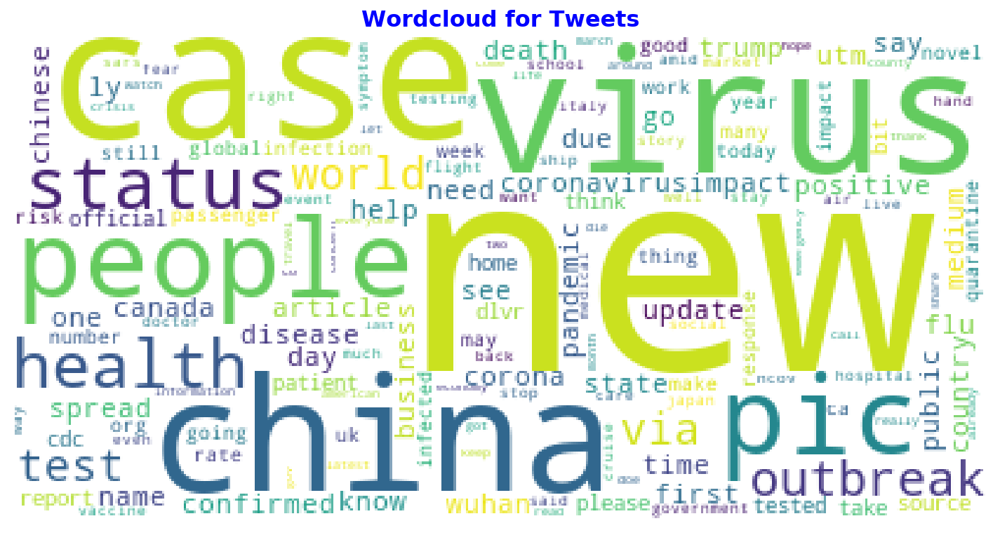

In [48]:
tweets = " ".join(t for t in final_tweets.clean_tweets)
plot_wordcloud(tweets, "Wordcloud for Tweets")

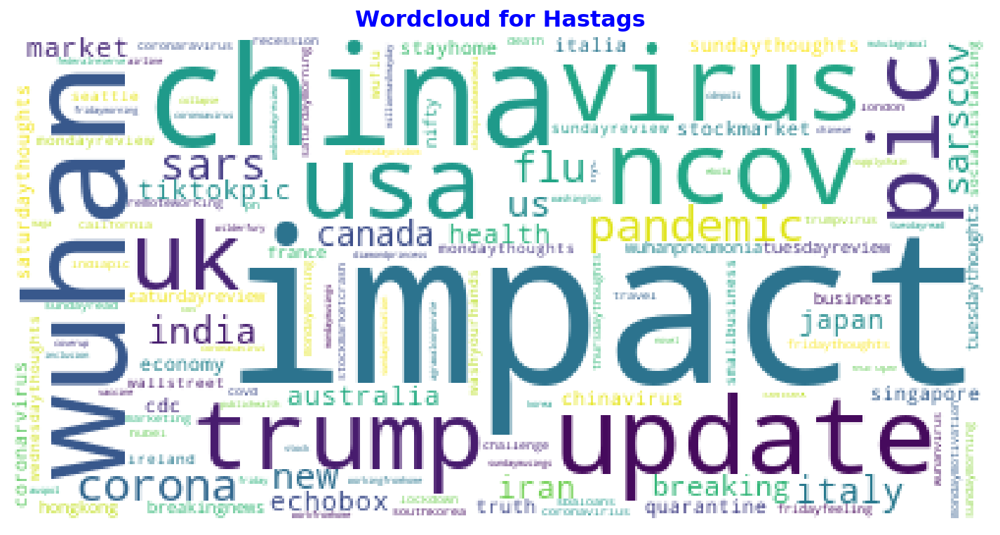

In [49]:
hashtags = " ".join(t for t in final_tweets.clean_hashtags)
type(hashtags)
# filtering out words that are part of hashtags used for extraction of tweets to gain insights into themes of hashtags
hashtags = hashtags.replace('covid', '')
hashtags = hashtags.replace('coronavirus', '')
hashtags = hashtags.replace('coronavirusoutbreak', '')
hashtags = hashtags.replace('coronaoutbreak', '')
hashtags = hashtags.replace('outbreak', '')
hashtags = hashtags.replace('https', '')
hashtags = hashtags.replace('coronavirusimpact', '')
# plot the word cloud after hashtag eliminations
plot_wordcloud(hashtags, "Wordcloud for Hastags")

In [50]:
final_tweets.columns

Index(['screen_name', 'username', 'user_id', 'tweet_id', 'tweet_url',
       'timestamp', 'timestamp_epochs', 'text', 'text_html', 'links',
       'hashtags', 'has_media', 'img_urls', 'video_url', 'likes', 'retweets',
       'replies', 'is_replied', 'is_reply_to', 'parent_tweet_id',
       'reply_to_users', 'clean_tweets', 'clean_hashtags'],
      dtype='object')

In [69]:
plot_df.head()

screen_name
GETAnalysis       129
itchy__fingers     58
bitcoinconnect     45
Beacon_1A1         42
TPE_connect        39
Name: tweet_id, dtype: int64

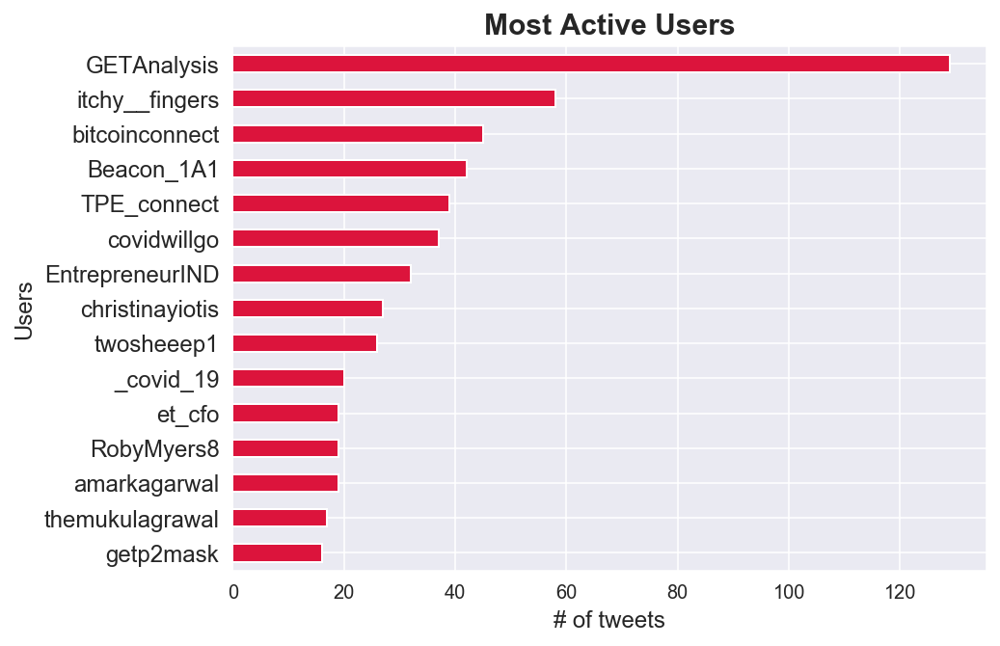

In [86]:
# most active users - most number of tweets, most likes, retweets and replies
plt.figure(figsize = (7,5))
sns.set_style("darkgrid")
final_tweets.groupby(['screen_name'])['tweet_id'].count().sort_values(ascending = False).head(15).plot(kind = 'barh', color = 'crimson')
plt.xticks(fontsize= 10)
plt.yticks(fontsize= 12)
plt.title('Most Active Users', fontsize = 15, weight = 'bold')
plt.xlabel('# of tweets', fontsize = 12)
plt.ylabel('Users', fontsize = 12);
plt.gca().invert_yaxis();

**Steady increase of tweets over time in 2020**

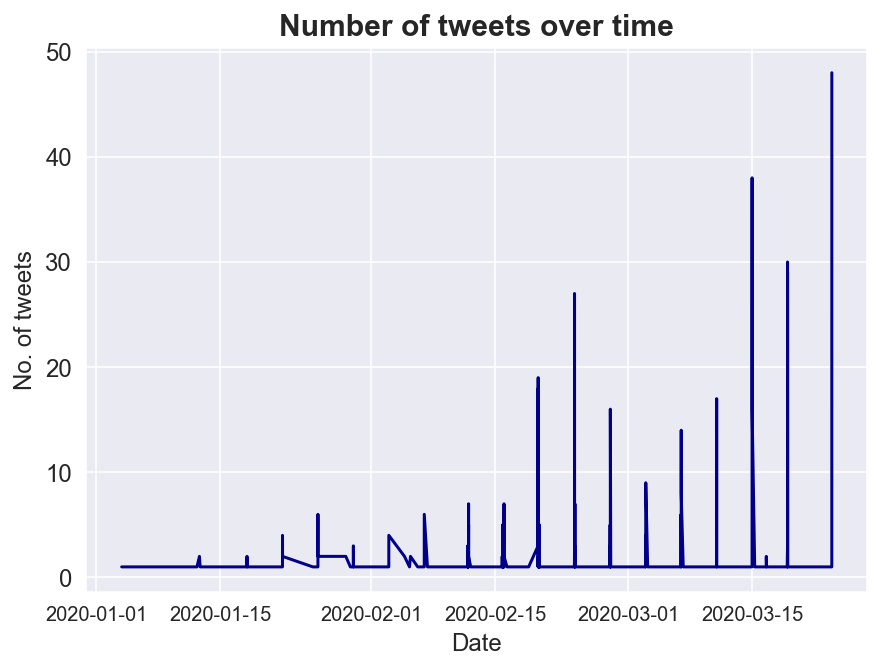

In [127]:
# check for tweeting trends 
plotdf = final_tweets.groupby('timestamp')['tweet_id'].count().to_frame(name = 'count').reset_index()
plt.figure(figsize = (7,5))
plt.plot(plotdf['timestamp'], plotdf['count'], color = 'darkblue')
plt.xticks(fontsize= 10)
plt.yticks(fontsize= 12)
plt.title('Number of tweets over time', fontsize = 15, weight = 'bold')
plt.xlabel('Date', fontsize = 12)
plt.ylabel('No. of tweets', fontsize = 12);

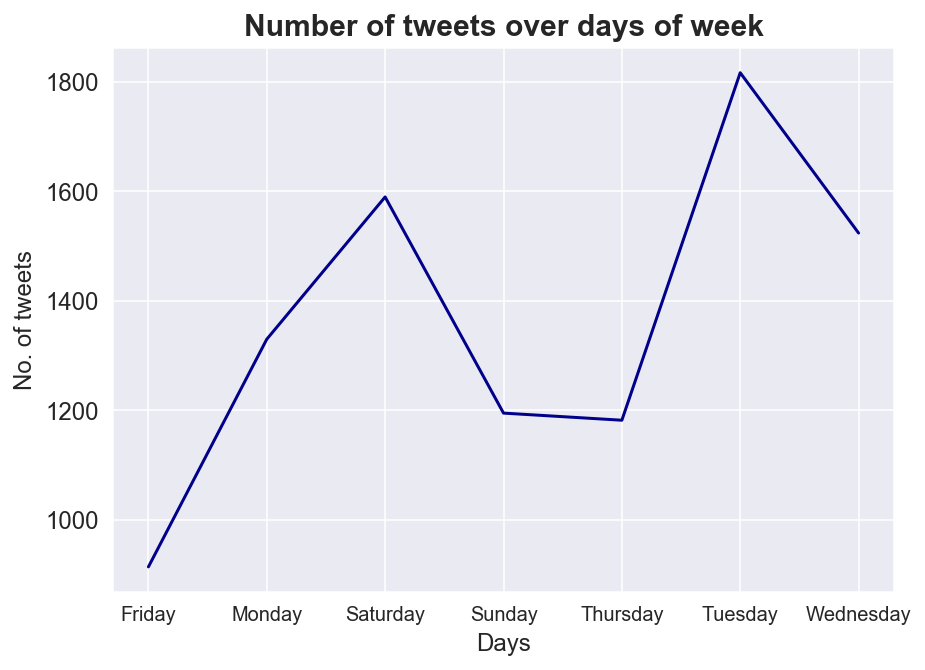

In [145]:
# check for tweeting trends - to be sorted by day
plotdf1 = final_tweets.groupby(plotdf.timestamp.dt.day_name())['tweet_id'].count().to_frame(name = 'count').reset_index()
plt.figure(figsize = (7,5))
plt.plot(plotdf1['timestamp'], plotdf1['count'], color = 'darkblue')
plt.xticks(fontsize= 10)
plt.yticks(fontsize= 12)
plt.title('Number of tweets over days of week', fontsize = 15, weight = 'bold')
plt.xlabel('Days', fontsize = 12)
plt.ylabel('No. of tweets', fontsize = 12);

In [52]:
# total tweets 
print ('Total tweets:', len(final_tweets.index), '\n')

# Retweets
tweet_df = final_tweets.sort_values(by='retweets', ascending=False)
tweet_df = tweet_df.reset_index(drop=True)
print ('Mean retweets:', round(tweet_df['retweets'].mean(),2), '\n')
print ('Top 5 RTed tweets:')
print ('------------------')
for i in range(5):
    print (tweet_df['text'].iloc[i], '-', tweet_df['retweets'].iloc[i])
    print ('\n')
    
# Likes
tweet_df_likes = final_tweets.sort_values(by='likes', ascending=False)
tweet_df_likes = tweet_df_likes.reset_index(drop=True)
print ('Mean likes:', round(tweet_df_likes['likes'].mean(),2), '\n')
print ('Top 5 liked tweets:')
print ('-------------------')
for i in range(5):
    print (tweet_df_likes['text'].iloc[i], '-', tweet_df_likes['likes'].iloc[i])
    print ('\n')

Total tweets: 14846 

Mean retweets: 5.44 

Top 5 RTed tweets:
------------------
dont fall for this. korea has recorded the highest case so far. every wilayah dah ada kes covid-19. rather than buying and you need to cancel ur flight, baik duduk bersabar dan bertenang dulu. https://twitter.com/pmbrutiketmurah/status/1231613475656359936 … - 7561


The Honourable Minister of Health has announced a confirmed coronavirus disease (COVID-19) case in Lagos State

The case, which was confirmed on the 27th of February 2020, is the first case to be reported in Nigeria since the beginning of the outbreak in China in January 2020 pic.twitter.com/r6uJfeIUhv - 6417


The Federal Ministry of Health has confirmed a coronavirus(Covid-19) case in Lagos State Nigeria. The case which was confirmed on 27/02/2020 is the first case to be reported in Nigeria since the beginning of the outbreak in China in January 2020 @WHO @BBCWorld #CoronaVirusUpdatespic.twitter.com/uF79NYzvAz - 5102


The Federal Ministry o